<B>Background</B>

Shaun is a Sales Director, Food Services Division at a major Food & Beverages Manufacturer. He has just been promoted into his role for top notch sales performance as well his keen analytic aptitude. 

True to his nature, he’s constantly on the lookout for newer sources of data to drive business (other than the sales data that comes from internal systems). In a review with his team, he landed on what he thought was right in this space (see attached a sample of this). The spreadsheet has 3 tabs, that have the following:

**1)Total spend of his customers (restaurants) across various F&B categories, along with % share of purchases from Shaun’s company**

**2)Data about non-commercial establishments such as hospitals, schools across different geographic areas.**

**3)Retail outlets spread across similar geographies.**

Shaun would like to use this to perform an “Opportunities Analysis”. He has an annual conference coming up in less than a week to prepare for, but wanted to get this started without delay. 

He jotted down a few bullets to convey what he has in mind as the charter for the analysis.

-Get a quick view of share of total spends and F&B spends for existing customers (restaurants)

-What are the adjacent opportunities from the non-commercial establishments to additionally sell into (note that there are no customers currently in the non-commercial segment)

-Retailers is a different business division and hence out of scope for me (Shaun), but some of my customers / prospects could be buying from these retailers – so getting a view of retailer presence adjacent to his customers & prospects will help understand how much of these opportunities are being met / unmet.

-I would like the analyses to be simple, intuitive as well as give me a picture at different levels of geographic granularity as well as by different business segments. In short, “it should the tell a story around where are our biggest opportunities”


In [ ]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
from scipy.stats import norm

In [ ]:
df=pd.read_excel('/content/Food_services.docx-EmbeddedFile.xlsx')
df.head()

,NAME,CITY,STATE,ZIP,ZIP_PLUS4,COUNTY_CODE,COUNTY_NAME,MSA,MARKET_SEGMENT,SIMPLIFIED_MENU,...,AVERAGE_CHECK,NUMBER_OF_ROOMS,FOOD_BEVERAGE_PURCHASE,FOOD_PURCHASE,BEVERAGE_PURCHASE,TOTAL_CATEGORY_DRY,TOTAL_CATEGORY_FRESH,TOTAL_CATEGORY_FROZEN,TOTAL_CATEGORY_PROTEIN,% Share of F&B Purchases from Company
0,APPLEBEE'S,POTTSTOWN,PA,19464,NaN,42091.0,MONTGOMERY,6162.0,"FSR - TRADITIONAL RESTAURANTS, CASUAL DINING",CLASSIC & VARIED MENU,...,$10 TO $15,NOT APPLICABLE,597290.100988,545006.687015,52283.413973,73292.586865,96286.339607,124412.626443,212623.779075,0.578681
1,STANS RESTAURANT,SAN LEANDRO,CA,94577,3236.0,6001.0,ALAMEDA,7362.0,"FSR - TRADITIONAL RESTAURANTS, CASUAL DINING",CLASSIC & VARIED MENU,...,$15 TO $20,NOT APPLICABLE,39742.939174,36264.065946,3478.873227,4876.797417,6406.773077,8278.261162,14147.721358,0.339348
2,THANH THANH,OAKLAND,CA,94606,2978.0,6001.0,ALAMEDA,7362.0,"FSR - TRADITIONAL RESTAURANTS, CASUAL DINING",CLASSIC & VARIED MENU,...,$15 TO $20,NOT APPLICABLE,39742.939174,36264.065946,3478.873227,4876.797417,6406.773077,8278.261162,14147.721358,0.646409
3,DOMINO'S PIZZA,WENDELL,NC,27591,6904.0,37183.0,WAKE,6640.0,"LSR - QUICK SERVICE RESTAURANTS, FAST FOOD, SN...","PIZZA, PASTA & ITALIAN",...,$7 TO $10,NOT APPLICABLE,282606.140700,231329.707646,51276.433054,49474.097973,27035.026215,58876.279313,53078.768135,0.797020
4,NINNA RESTAURANT,OAKLAND,CA,94611,5221.0,6001.0,ALAMEDA,7362.0,"FSR - TRADITIONAL RESTAURANTS, CASUAL DINING",OTHER ASIAN,...,$15 TO $20,NOT APPLICABLE,42645.370261,40042.762870,2602.607391,6395.821567,8260.449546,5938.274331,15827.198446,0.655083


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 25 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   NAME                                   1000 non-null   object 
 1   CITY                                   1000 non-null   object 
 2   STATE                                  1000 non-null   object 
 3   ZIP                                    1000 non-null   int64  
 4   ZIP_PLUS4                              962 non-null    float64
 5   COUNTY_CODE                            999 non-null    float64
 6   COUNTY_NAME                            999 non-null    object 
 7   MSA                                    826 non-null    float64
 8   MARKET_SEGMENT                         1000 non-null   object 
 9   SIMPLIFIED_MENU                        1000 non-null   object 
 10  MENU_TYPE                              1000 non-null   object 
 11  UNITS

In [ ]:
df.shape

(1000, 25)

In [ ]:
df.columns

Index(['NAME', 'CITY', 'STATE', 'ZIP', 'ZIP_PLUS4', 'COUNTY_CODE',
       'COUNTY_NAME', 'MSA', 'MARKET_SEGMENT', 'SIMPLIFIED_MENU', 'MENU_TYPE',
       'UNITS', 'EMPLOYEES', 'YEARS_IN_BUSINESS', 'ANNUAL_SALES',
       'AVERAGE_CHECK', 'NUMBER_OF_ROOMS', 'FOOD_BEVERAGE_PURCHASE',
       'FOOD_PURCHASE', 'BEVERAGE_PURCHASE', 'TOTAL_CATEGORY_DRY',
       'TOTAL_CATEGORY_FRESH', 'TOTAL_CATEGORY_FROZEN',
       'TOTAL_CATEGORY_PROTEIN', '% Share of F&B Purchases from Company'],
      dtype='object')

In [ ]:
df.isnull().sum()

NAME                                       0
CITY                                       0
STATE                                      0
ZIP                                        0
ZIP_PLUS4                                 38
COUNTY_CODE                                1
COUNTY_NAME                                1
MSA                                      174
MARKET_SEGMENT                             0
SIMPLIFIED_MENU                            0
MENU_TYPE                                  0
UNITS                                      0
EMPLOYEES                                  0
YEARS_IN_BUSINESS                          0
ANNUAL_SALES                               0
AVERAGE_CHECK                              0
NUMBER_OF_ROOMS                            0
FOOD_BEVERAGE_PURCHASE                   111
FOOD_PURCHASE                            111
BEVERAGE_PURCHASE                        111
TOTAL_CATEGORY_DRY                       111
TOTAL_CATEGORY_FRESH                     111
TOTAL_CATE

In [ ]:
df.dropna(inplace=True)
df

,NAME,CITY,STATE,ZIP,ZIP_PLUS4,COUNTY_CODE,COUNTY_NAME,MSA,MARKET_SEGMENT,SIMPLIFIED_MENU,...,AVERAGE_CHECK,NUMBER_OF_ROOMS,FOOD_BEVERAGE_PURCHASE,FOOD_PURCHASE,BEVERAGE_PURCHASE,TOTAL_CATEGORY_DRY,TOTAL_CATEGORY_FRESH,TOTAL_CATEGORY_FROZEN,TOTAL_CATEGORY_PROTEIN,% Share of F&B Purchases from Company
1,STANS RESTAURANT,SAN LEANDRO,CA,94577,3236.0,6001.0,ALAMEDA,7362.0,"FSR - TRADITIONAL RESTAURANTS, CASUAL DINING",CLASSIC & VARIED MENU,...,$15 TO $20,NOT APPLICABLE,3.974294e+04,3.626407e+04,3478.873227,4876.797417,6406.773077,8278.261162,14147.721358,0.339348
2,THANH THANH,OAKLAND,CA,94606,2978.0,6001.0,ALAMEDA,7362.0,"FSR - TRADITIONAL RESTAURANTS, CASUAL DINING",CLASSIC & VARIED MENU,...,$15 TO $20,NOT APPLICABLE,3.974294e+04,3.626407e+04,3478.873227,4876.797417,6406.773077,8278.261162,14147.721358,0.646409
3,DOMINO'S PIZZA,WENDELL,NC,27591,6904.0,37183.0,WAKE,6640.0,"LSR - QUICK SERVICE RESTAURANTS, FAST FOOD, SN...","PIZZA, PASTA & ITALIAN",...,$7 TO $10,NOT APPLICABLE,2.826061e+05,2.313297e+05,51276.433054,49474.097973,27035.026215,58876.279313,53078.768135,0.797020
4,NINNA RESTAURANT,OAKLAND,CA,94611,5221.0,6001.0,ALAMEDA,7362.0,"FSR - TRADITIONAL RESTAURANTS, CASUAL DINING",OTHER ASIAN,...,$15 TO $20,NOT APPLICABLE,4.264537e+04,4.004276e+04,2602.607391,6395.821567,8260.449546,5938.274331,15827.198446,0.655083
5,BROOKLYN DISCOUNT DELI,BERKELEY,CA,94704,1919.0,6001.0,ALAMEDA,7362.0,LSR - QUICK CASUAL,"SANDWICHES, SOUPS AND SALADS, DELI, SUBS & HOT...",...,$7 TO $10,NOT APPLICABLE,4.696677e+04,4.186811e+04,5098.658166,5571.577184,6591.308817,9054.428704,16690.100352,0.780505
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,SUBWAY,CARROLLTON,TX,75010,6337.0,48121.0,DENTON,1922.0,"LSR - QUICK SERVICE RESTAURANTS, FAST FOOD, SN...","SANDWICHES, SOUPS AND SALADS, DELI, SUBS & HOT...",...,$5 TO $7,NOT APPLICABLE,1.264464e+05,1.082253e+05,18221.074108,20302.620653,19035.592321,27723.786598,26652.845984,0.987625
996,RED LOBSTER,INGLEWOOD,CA,90303,1264.0,6037.0,LOS ANGELES,4472.0,"FSR - TRADITIONAL RESTAURANTS, CASUAL DINING","STEAK, SEAFOOD & FISH",...,$10 TO $15,NOT APPLICABLE,1.096238e+06,1.026739e+06,69498.776116,142453.292480,191473.607862,182514.281291,440158.915398,0.599890
997,REYNOLDS CAFE,NAUGATUCK,CT,6770,3216.0,9009.0,NEW HAVEN,5602.0,"FSR - CAF╔-RESTAURANTS, FAMILY-STYLE, DINER",CLASSIC & VARIED MENU,...,$15 TO $20,NOT APPLICABLE,4.240708e+04,3.843948e+04,3967.601528,5235.276904,6858.790982,9732.188501,13174.927943,0.302793
998,PUEBLO VIEJO,PORT SAINT LUCIE,FL,34952,5469.0,12111.0,SAINT LUCIE,2710.0,"FSR - TRADITIONAL RESTAURANTS, CASUAL DINING",CLASSIC & VARIED MENU,...,$15 TO $20,NOT APPLICABLE,8.948728e+04,8.165407e+04,7833.212973,10980.852218,14425.825462,18639.765949,31855.749617,0.497217


In [ ]:
df.describe()


,ZIP,ZIP_PLUS4,COUNTY_CODE,MSA,FOOD_BEVERAGE_PURCHASE,FOOD_PURCHASE,BEVERAGE_PURCHASE,TOTAL_CATEGORY_DRY,TOTAL_CATEGORY_FRESH,TOTAL_CATEGORY_FROZEN,TOTAL_CATEGORY_PROTEIN,% Share of F&B Purchases from Company
count,718.000000,718.000000,718.000000,718.000000,7.180000e+02,7.180000e+02,718.000000,718.000000,718.000000,718.000000,718.000000,718.000000
mean,49939.845404,3988.281337,28080.002786,4717.344011,2.257134e+05,1.990493e+05,26664.096153,34453.231723,32705.300907,40345.083005,67807.915801,0.488092
std,30204.562144,2223.696151,16320.405312,2555.345426,2.192271e+05,1.986419e+05,26309.923171,30941.584601,34563.983696,39039.762732,81928.056547,0.287645
min,1545.000000,231.000000,1003.000000,160.000000,2.384444e+04,2.032420e+04,1764.301190,3548.255408,3310.131976,3489.133032,0.000000,0.001300
25%,23223.000000,2266.750000,12086.750000,2162.000000,8.948728e+04,8.097584e+04,8219.163568,13039.378520,14121.155990,15842.289737,22929.397288,0.232582
50%,43384.000000,3504.000000,28596.000000,4992.000000,1.583970e+05,1.344164e+05,16131.171723,22932.163773,22704.835994,27756.214374,39857.299443,0.488392
75%,78468.000000,5423.000000,42064.000000,6670.000000,2.706886e+05,2.381639e+05,38366.689425,48520.834669,35879.242322,49540.365410,76648.086882,0.738443
max,99336.000000,9900.000000,55101.000000,9320.000000,1.588743e+06,1.449674e+06,164893.749695,196115.965679,263602.412089,330927.477608,605968.379128,0.999887


In [ ]:
df.isnull().values.any()


False

In [ ]:
#feature engineering
#Filling all missing values with 0
data = df.fillna(0)
#Filling missing values with medians of the columns
data = df.fillna(df.median())
data

<ipython-input-10-f4e4da95ab03>:5: FutureWarning: The default value of numeric_only in DataFrame.median is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  data = df.fillna(df.median())


,NAME,CITY,STATE,ZIP,ZIP_PLUS4,COUNTY_CODE,COUNTY_NAME,MSA,MARKET_SEGMENT,SIMPLIFIED_MENU,...,AVERAGE_CHECK,NUMBER_OF_ROOMS,FOOD_BEVERAGE_PURCHASE,FOOD_PURCHASE,BEVERAGE_PURCHASE,TOTAL_CATEGORY_DRY,TOTAL_CATEGORY_FRESH,TOTAL_CATEGORY_FROZEN,TOTAL_CATEGORY_PROTEIN,% Share of F&B Purchases from Company
1,STANS RESTAURANT,SAN LEANDRO,CA,94577,3236.0,6001.0,ALAMEDA,7362.0,"FSR - TRADITIONAL RESTAURANTS, CASUAL DINING",CLASSIC & VARIED MENU,...,$15 TO $20,NOT APPLICABLE,3.974294e+04,3.626407e+04,3478.873227,4876.797417,6406.773077,8278.261162,14147.721358,0.339348
2,THANH THANH,OAKLAND,CA,94606,2978.0,6001.0,ALAMEDA,7362.0,"FSR - TRADITIONAL RESTAURANTS, CASUAL DINING",CLASSIC & VARIED MENU,...,$15 TO $20,NOT APPLICABLE,3.974294e+04,3.626407e+04,3478.873227,4876.797417,6406.773077,8278.261162,14147.721358,0.646409
3,DOMINO'S PIZZA,WENDELL,NC,27591,6904.0,37183.0,WAKE,6640.0,"LSR - QUICK SERVICE RESTAURANTS, FAST FOOD, SN...","PIZZA, PASTA & ITALIAN",...,$7 TO $10,NOT APPLICABLE,2.826061e+05,2.313297e+05,51276.433054,49474.097973,27035.026215,58876.279313,53078.768135,0.797020
4,NINNA RESTAURANT,OAKLAND,CA,94611,5221.0,6001.0,ALAMEDA,7362.0,"FSR - TRADITIONAL RESTAURANTS, CASUAL DINING",OTHER ASIAN,...,$15 TO $20,NOT APPLICABLE,4.264537e+04,4.004276e+04,2602.607391,6395.821567,8260.449546,5938.274331,15827.198446,0.655083
5,BROOKLYN DISCOUNT DELI,BERKELEY,CA,94704,1919.0,6001.0,ALAMEDA,7362.0,LSR - QUICK CASUAL,"SANDWICHES, SOUPS AND SALADS, DELI, SUBS & HOT...",...,$7 TO $10,NOT APPLICABLE,4.696677e+04,4.186811e+04,5098.658166,5571.577184,6591.308817,9054.428704,16690.100352,0.780505
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,SUBWAY,CARROLLTON,TX,75010,6337.0,48121.0,DENTON,1922.0,"LSR - QUICK SERVICE RESTAURANTS, FAST FOOD, SN...","SANDWICHES, SOUPS AND SALADS, DELI, SUBS & HOT...",...,$5 TO $7,NOT APPLICABLE,1.264464e+05,1.082253e+05,18221.074108,20302.620653,19035.592321,27723.786598,26652.845984,0.987625
996,RED LOBSTER,INGLEWOOD,CA,90303,1264.0,6037.0,LOS ANGELES,4472.0,"FSR - TRADITIONAL RESTAURANTS, CASUAL DINING","STEAK, SEAFOOD & FISH",...,$10 TO $15,NOT APPLICABLE,1.096238e+06,1.026739e+06,69498.776116,142453.292480,191473.607862,182514.281291,440158.915398,0.599890
997,REYNOLDS CAFE,NAUGATUCK,CT,6770,3216.0,9009.0,NEW HAVEN,5602.0,"FSR - CAF╔-RESTAURANTS, FAMILY-STYLE, DINER",CLASSIC & VARIED MENU,...,$15 TO $20,NOT APPLICABLE,4.240708e+04,3.843948e+04,3967.601528,5235.276904,6858.790982,9732.188501,13174.927943,0.302793
998,PUEBLO VIEJO,PORT SAINT LUCIE,FL,34952,5469.0,12111.0,SAINT LUCIE,2710.0,"FSR - TRADITIONAL RESTAURANTS, CASUAL DINING",CLASSIC & VARIED MENU,...,$15 TO $20,NOT APPLICABLE,8.948728e+04,8.165407e+04,7833.212973,10980.852218,14425.825462,18639.765949,31855.749617,0.497217


In [ ]:
df.columns.value_counts().sum()


25

In [ ]:
df.columns

Index(['NAME', 'CITY', 'STATE', 'ZIP', 'ZIP_PLUS4', 'COUNTY_CODE',
       'COUNTY_NAME', 'MSA', 'MARKET_SEGMENT', 'SIMPLIFIED_MENU', 'MENU_TYPE',
       'UNITS', 'EMPLOYEES', 'YEARS_IN_BUSINESS', 'ANNUAL_SALES',
       'AVERAGE_CHECK', 'NUMBER_OF_ROOMS', 'FOOD_BEVERAGE_PURCHASE',
       'FOOD_PURCHASE', 'BEVERAGE_PURCHASE', 'TOTAL_CATEGORY_DRY',
       'TOTAL_CATEGORY_FRESH', 'TOTAL_CATEGORY_FROZEN',
       'TOTAL_CATEGORY_PROTEIN', '% Share of F&B Purchases from Company'],
      dtype='object')

In [ ]:
df.drop(['CITY','COUNTY_CODE'],axis=1, inplace=True)
df.head()


,NAME,STATE,MARKET_SEGMENT,SIMPLIFIED_MENU,MENU_TYPE,UNITS,ANNUAL_SALES,AVERAGE_CHECK,FOOD_BEVERAGE_PURCHASE,FOOD_PURCHASE,BEVERAGE_PURCHASE,TOTAL_CATEGORY_DRY,TOTAL_CATEGORY_FRESH,TOTAL_CATEGORY_FROZEN,TOTAL_CATEGORY_PROTEIN,% Share of F&B Purchases from Company
1,STANS RESTAURANT,CA,"FSR - TRADITIONAL RESTAURANTS, CASUAL DINING",CLASSIC & VARIED MENU,VARIED MENU,INDEPENDENT (1-9 UNITS),"<=$500,000",$15 TO $20,39742.939174,36264.065946,3478.873227,4876.797417,6406.773077,8278.261162,14147.721358,0.339348
2,THANH THANH,CA,"FSR - TRADITIONAL RESTAURANTS, CASUAL DINING",CLASSIC & VARIED MENU,VARIED MENU,INDEPENDENT (1-9 UNITS),"<=$500,000",$15 TO $20,39742.939174,36264.065946,3478.873227,4876.797417,6406.773077,8278.261162,14147.721358,0.646409
3,DOMINO'S PIZZA,NC,"LSR - QUICK SERVICE RESTAURANTS, FAST FOOD, SN...","PIZZA, PASTA & ITALIAN",PIZZERIA,501+ UNITS,"$500,001 - $1,000,000",$7 TO $10,282606.140700,231329.707646,51276.433054,49474.097973,27035.026215,58876.279313,53078.768135,0.797020
4,NINNA RESTAURANT,CA,"FSR - TRADITIONAL RESTAURANTS, CASUAL DINING",OTHER ASIAN,ASIAN UNCLASSIFIED,INDEPENDENT (1-9 UNITS),"<=$500,000",$15 TO $20,42645.370261,40042.762870,2602.607391,6395.821567,8260.449546,5938.274331,15827.198446,0.655083
5,BROOKLYN DISCOUNT DELI,CA,LSR - QUICK CASUAL,"SANDWICHES, SOUPS AND SALADS, DELI, SUBS & HOT...",DELI,INDEPENDENT (1-9 UNITS),"<=$500,000",$7 TO $10,46966.770000,41868.111834,5098.658166,5571.577184,6591.308817,9054.428704,16690.100352,0.780505


In [ ]:
# loop through datatset to find count of unique values of each column
for x in df.columns:
    print(x,':',len(df[x].unique()))


NAME : 543
STATE : 46
MARKET_SEGMENT : 12
SIMPLIFIED_MENU : 19
MENU_TYPE : 42
UNITS : 6
ANNUAL_SALES : 5
AVERAGE_CHECK : 9
FOOD_BEVERAGE_PURCHASE : 560
FOOD_PURCHASE : 560
BEVERAGE_PURCHASE : 560
TOTAL_CATEGORY_DRY : 560
TOTAL_CATEGORY_FRESH : 560
TOTAL_CATEGORY_FROZEN : 560
TOTAL_CATEGORY_PROTEIN : 513
% Share of F&B Purchases from Company : 718


In [ ]:
# Check for missing values in all the columnns of the dataset
df.isnull().sum()


NAME                                     0
STATE                                    0
MARKET_SEGMENT                           0
SIMPLIFIED_MENU                          0
MENU_TYPE                                0
UNITS                                    0
ANNUAL_SALES                             0
AVERAGE_CHECK                            0
FOOD_BEVERAGE_PURCHASE                   0
FOOD_PURCHASE                            0
BEVERAGE_PURCHASE                        0
TOTAL_CATEGORY_DRY                       0
TOTAL_CATEGORY_FRESH                     0
TOTAL_CATEGORY_FROZEN                    0
TOTAL_CATEGORY_PROTEIN                   0
% Share of F&B Purchases from Company    0
dtype: int64

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


GridSpec(6, 8)

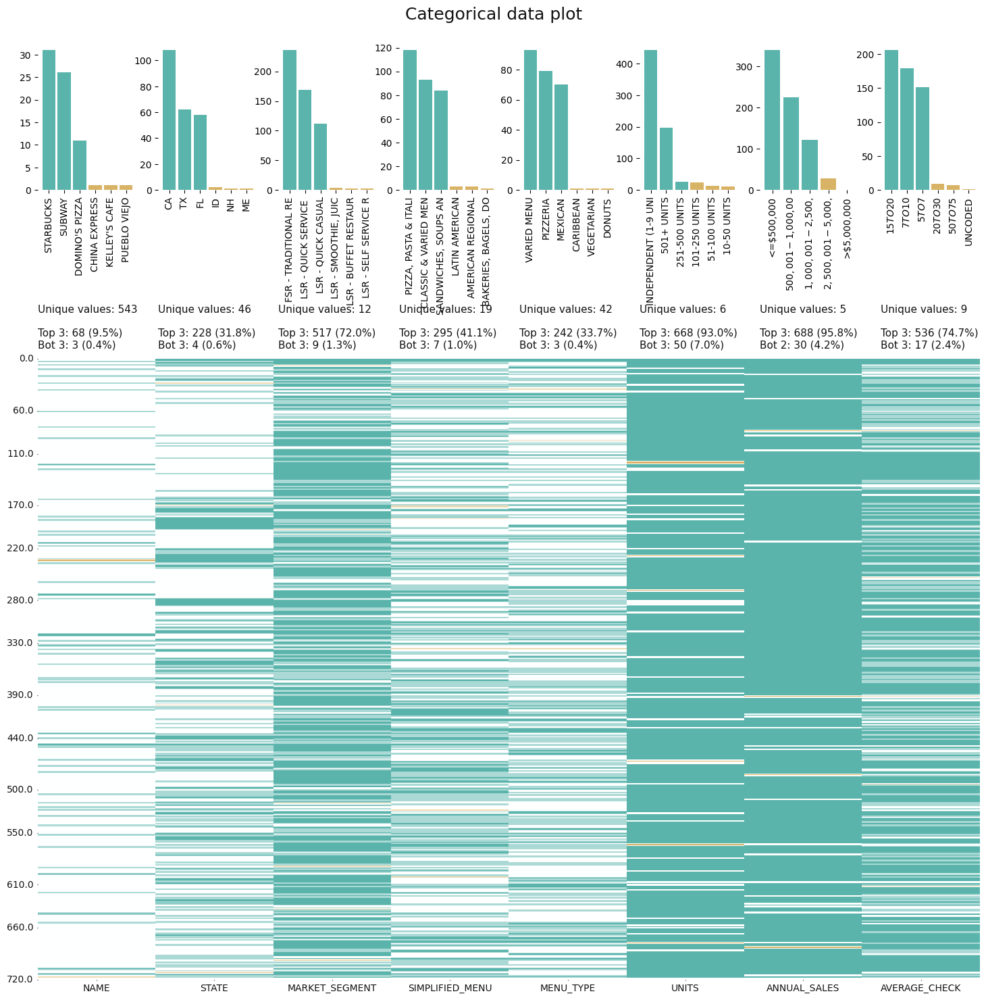

In [ ]:
!pip install klib
import klib
klib.cat_plot(df)

In [ ]:
klib.data_cleaning(df)


Long column names detected (>25 characters). Consider renaming the following columns ['percent_share_of_f_and_b_purchases_from_company'].
Shape of cleaned data: (718, 16) - Remaining NAs: 0


Dropped rows: 0
     of which 0 duplicates. (Rows (first 150 shown): [])

Dropped columns: 0
     of which 0 single valued.     Columns: []
Dropped missing values: 0
Reduced memory by at least: 0.05 MB (-45.45%)



,name,state,market_segment,simplified_menu,menu_type,units,annual_sales,average_check,food_beverage_purchase,food_purchase,beverage_purchase,total_category_dry,total_category_fresh,total_category_frozen,total_category_protein,percent_share_of_f_and_b_purchases_from_company
0,STANS RESTAURANT,CA,"FSR - TRADITIONAL RESTAURANTS, CASUAL DINING",CLASSIC & VARIED MENU,VARIED MENU,INDEPENDENT (1-9 UNITS),"<=$500,000",$15 TO $20,3.974294e+04,3.626407e+04,3478.873227,4876.797417,6406.773077,8278.261162,14147.721358,0.339348
1,THANH THANH,CA,"FSR - TRADITIONAL RESTAURANTS, CASUAL DINING",CLASSIC & VARIED MENU,VARIED MENU,INDEPENDENT (1-9 UNITS),"<=$500,000",$15 TO $20,3.974294e+04,3.626407e+04,3478.873227,4876.797417,6406.773077,8278.261162,14147.721358,0.646409
2,DOMINO'S PIZZA,NC,"LSR - QUICK SERVICE RESTAURANTS, FAST FOOD, SN...","PIZZA, PASTA & ITALIAN",PIZZERIA,501+ UNITS,"$500,001 - $1,000,000",$7 TO $10,2.826061e+05,2.313297e+05,51276.433054,49474.097973,27035.026215,58876.279313,53078.768135,0.797020
3,NINNA RESTAURANT,CA,"FSR - TRADITIONAL RESTAURANTS, CASUAL DINING",OTHER ASIAN,ASIAN UNCLASSIFIED,INDEPENDENT (1-9 UNITS),"<=$500,000",$15 TO $20,4.264537e+04,4.004276e+04,2602.607391,6395.821567,8260.449546,5938.274331,15827.198446,0.655083
4,BROOKLYN DISCOUNT DELI,CA,LSR - QUICK CASUAL,"SANDWICHES, SOUPS AND SALADS, DELI, SUBS & HOT...",DELI,INDEPENDENT (1-9 UNITS),"<=$500,000",$7 TO $10,4.696677e+04,4.186811e+04,5098.658166,5571.577184,6591.308817,9054.428704,16690.100352,0.780505
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
713,SUBWAY,TX,"LSR - QUICK SERVICE RESTAURANTS, FAST FOOD, SN...","SANDWICHES, SOUPS AND SALADS, DELI, SUBS & HOT...",SANDWICHES,501+ UNITS,"<=$500,000",$5 TO $7,1.264464e+05,1.082253e+05,18221.074108,20302.620653,19035.592321,27723.786598,26652.845984,0.987625
714,RED LOBSTER,CA,"FSR - TRADITIONAL RESTAURANTS, CASUAL DINING","STEAK, SEAFOOD & FISH",SEAFOOD & FISH,501+ UNITS,"$2,500,001 - $5,000,000",$10 TO $15,1.096238e+06,1.026739e+06,69498.776116,142453.292480,191473.607862,182514.281291,440158.915398,0.599890
715,REYNOLDS CAFE,CT,"FSR - CAF╔-RESTAURANTS, FAMILY-STYLE, DINER",CLASSIC & VARIED MENU,VARIED MENU,INDEPENDENT (1-9 UNITS),"<=$500,000",$15 TO $20,4.240708e+04,3.843948e+04,3967.601528,5235.276904,6858.790982,9732.188501,13174.927943,0.302793
716,PUEBLO VIEJO,FL,"FSR - TRADITIONAL RESTAURANTS, CASUAL DINING",CLASSIC & VARIED MENU,VARIED MENU,INDEPENDENT (1-9 UNITS),"<=$500,000",$15 TO $20,8.948728e+04,8.165407e+04,7833.212973,10980.852218,14425.825462,18639.765949,31855.749617,0.497217


In [ ]:
klib.clean_column_names(df)


Long column names detected (>25 characters). Consider renaming the following columns ['percent_share_of_f_and_b_purchases_from_company'].


,name,state,market_segment,simplified_menu,menu_type,units,annual_sales,average_check,food_beverage_purchase,food_purchase,beverage_purchase,total_category_dry,total_category_fresh,total_category_frozen,total_category_protein,percent_share_of_f_and_b_purchases_from_company
1,STANS RESTAURANT,CA,"FSR - TRADITIONAL RESTAURANTS, CASUAL DINING",CLASSIC & VARIED MENU,VARIED MENU,INDEPENDENT (1-9 UNITS),"<=$500,000",$15 TO $20,3.974294e+04,3.626407e+04,3478.873227,4876.797417,6406.773077,8278.261162,14147.721358,0.339348
2,THANH THANH,CA,"FSR - TRADITIONAL RESTAURANTS, CASUAL DINING",CLASSIC & VARIED MENU,VARIED MENU,INDEPENDENT (1-9 UNITS),"<=$500,000",$15 TO $20,3.974294e+04,3.626407e+04,3478.873227,4876.797417,6406.773077,8278.261162,14147.721358,0.646409
3,DOMINO'S PIZZA,NC,"LSR - QUICK SERVICE RESTAURANTS, FAST FOOD, SN...","PIZZA, PASTA & ITALIAN",PIZZERIA,501+ UNITS,"$500,001 - $1,000,000",$7 TO $10,2.826061e+05,2.313297e+05,51276.433054,49474.097973,27035.026215,58876.279313,53078.768135,0.797020
4,NINNA RESTAURANT,CA,"FSR - TRADITIONAL RESTAURANTS, CASUAL DINING",OTHER ASIAN,ASIAN UNCLASSIFIED,INDEPENDENT (1-9 UNITS),"<=$500,000",$15 TO $20,4.264537e+04,4.004276e+04,2602.607391,6395.821567,8260.449546,5938.274331,15827.198446,0.655083
5,BROOKLYN DISCOUNT DELI,CA,LSR - QUICK CASUAL,"SANDWICHES, SOUPS AND SALADS, DELI, SUBS & HOT...",DELI,INDEPENDENT (1-9 UNITS),"<=$500,000",$7 TO $10,4.696677e+04,4.186811e+04,5098.658166,5571.577184,6591.308817,9054.428704,16690.100352,0.780505
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,SUBWAY,TX,"LSR - QUICK SERVICE RESTAURANTS, FAST FOOD, SN...","SANDWICHES, SOUPS AND SALADS, DELI, SUBS & HOT...",SANDWICHES,501+ UNITS,"<=$500,000",$5 TO $7,1.264464e+05,1.082253e+05,18221.074108,20302.620653,19035.592321,27723.786598,26652.845984,0.987625
996,RED LOBSTER,CA,"FSR - TRADITIONAL RESTAURANTS, CASUAL DINING","STEAK, SEAFOOD & FISH",SEAFOOD & FISH,501+ UNITS,"$2,500,001 - $5,000,000",$10 TO $15,1.096238e+06,1.026739e+06,69498.776116,142453.292480,191473.607862,182514.281291,440158.915398,0.599890
997,REYNOLDS CAFE,CT,"FSR - CAF╔-RESTAURANTS, FAMILY-STYLE, DINER",CLASSIC & VARIED MENU,VARIED MENU,INDEPENDENT (1-9 UNITS),"<=$500,000",$15 TO $20,4.240708e+04,3.843948e+04,3967.601528,5235.276904,6858.790982,9732.188501,13174.927943,0.302793
998,PUEBLO VIEJO,FL,"FSR - TRADITIONAL RESTAURANTS, CASUAL DINING",CLASSIC & VARIED MENU,VARIED MENU,INDEPENDENT (1-9 UNITS),"<=$500,000",$15 TO $20,8.948728e+04,8.165407e+04,7833.212973,10980.852218,14425.825462,18639.765949,31855.749617,0.497217


In [ ]:
pip install pandas-profiling

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 324.4/324.4 kB 19.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 345.9/345.9 kB 30.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 33.7/33.7 MB 20.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 43.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 13.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 kB 16.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.5/78.5 kB 9.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 20.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 56.0 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=7c7c4702aa61c01525d6350144eb5a0b335b4576ed78d9

In [ ]:
from pandas_profiling import ProfileReport

In [ ]:
profile = ProfileReport(df, title="Pandas Profiling Report")

In [ ]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<ipython-input-34-d77e8416f56d>:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(),annot=True)


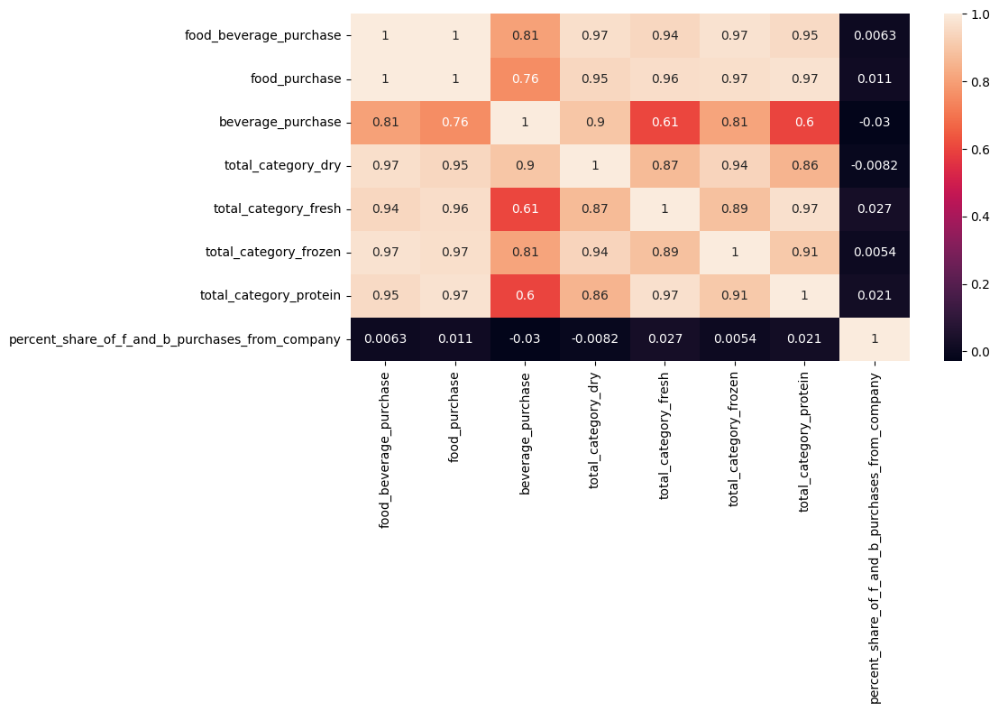

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,5))
sns.heatmap(df.corr(),annot=True)
plt.show()

In [ ]:
#correlation 
# Using pandas
corr = df.corr()
corr.style.background_gradient(cmap='coolwarm').set_precision(2)


<ipython-input-26-a51d020ea7e1>:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = df.corr()
<ipython-input-26-a51d020ea7e1>:4: FutureWarning: this method is deprecated in favour of `Styler.format(precision=..)`
  corr.style.background_gradient(cmap='coolwarm').set_precision(2)


,food_beverage_purchase,food_purchase,beverage_purchase,total_category_dry,total_category_fresh,total_category_frozen,total_category_protein,percent_share_of_f_and_b_purchases_from_company
food_beverage_purchase,1.00,1.00,0.81,0.97,0.94,0.97,0.95,0.01
food_purchase,1.00,1.00,0.76,0.95,0.96,0.97,0.97,0.01
beverage_purchase,0.81,0.76,1.00,0.90,0.61,0.81,0.60,-0.03
total_category_dry,0.97,0.95,0.90,1.00,0.87,0.94,0.86,-0.01
total_category_fresh,0.94,0.96,0.61,0.87,1.00,0.89,0.97,0.03
total_category_frozen,0.97,0.97,0.81,0.94,0.89,1.00,0.91,0.01
total_category_protein,0.95,0.97,0.60,0.86,0.97,0.91,1.00,0.02
percent_share_of_f_and_b_purchases_from_company,0.01,0.01,-0.03,-0.01,0.03,0.01,0.02,1.00


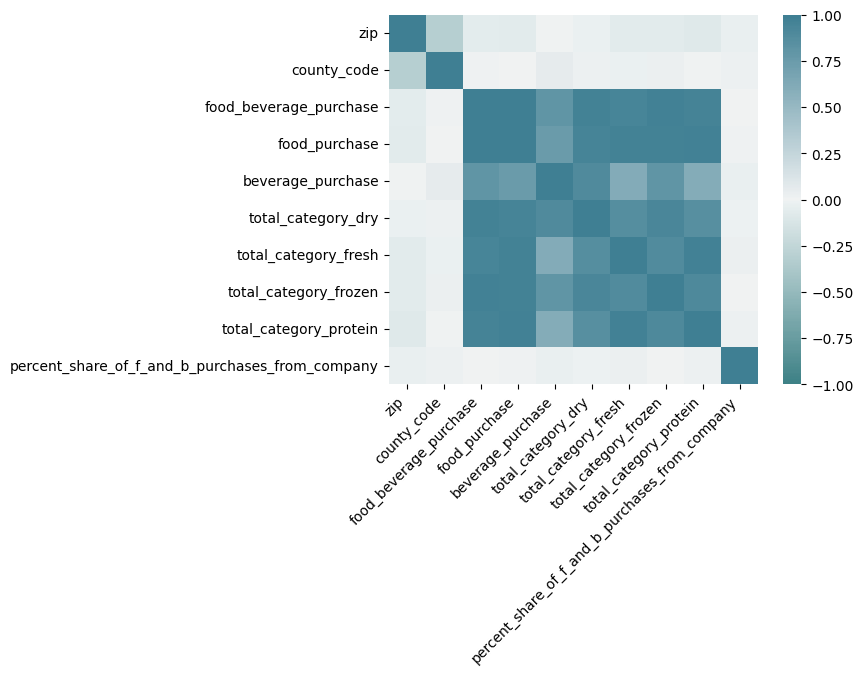

In [ ]:
# Using seaborn
import seaborn as sns
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(200, 220, n=800),
    square=True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);

<b>Preprocessing</b> 

In [ ]:
df['market_segment'].unique()

array(['FSR - TRADITIONAL RESTAURANTS, CASUAL DINING',
       'LSR - QUICK SERVICE RESTAURANTS, FAST FOOD, SNACKS',
       'LSR - QUICK CASUAL', 'LSR - COFFEE SHOPS, TEA HOUSES',
       'LSR - SMOOTHIE, JUICE',
       'FSR - CAF╔-RESTAURANTS, FAMILY-STYLE, DINER',
       'LSR - ICE CREAM PARLORS, FROZEN DESSERTS',
       'FSR - UPSCALE CASUAL DINING RESTAURANTS',
       'FSR - FINE DINING RESTAURANTS',
       'LSR - DELIVERY AND TAKE AWAY ONLY', 'LSR - BUFFET RESTAURANTS',
       'LSR - SELF SERVICE RESTAURANTS'], dtype=object)

In [ ]:
#label encoding 
df['market_segment']=df['market_segment'].replace("FSR - TRADITIONAL RESTAURANTS, CASUAL DINING","0")
df['market_segment']=df['market_segment'].replace("LSR - QUICK SERVICE RESTAURANTS, FAST FOOD, SNACKS","1")
df['market_segment']=df['market_segment'].replace("LSR - QUICK CASUAL","2")
df['market_segment']=df['market_segment'].replace("LSR - COFFEE SHOPS, TEA HOUSES","3")
df['market_segment']=df['market_segment'].replace("LSR - SMOOTHIE, JUICE","4")
df['market_segment']=df['market_segment'].replace("FSR - CAF╔-RESTAURANTS, FAMILY-STYLE, DINER","5")
df['market_segment']=df['market_segment'].replace("LSR - ICE CREAM PARLORS, FROZEN DESSERTS","6")
df['market_segment']=df['market_segment'].replace("FSR - UPSCALE CASUAL DINING RESTAURANTS","7")
df['market_segment']=df['market_segment'].replace("FSR - FINE DINING RESTAURANTS","8")
df['market_segment']=df['market_segment'].replace("LSR - DELIVERY AND TAKE AWAY ONLY","9")
df['market_segment']=df['market_segment'].replace("LSR - BUFFET RESTAURANTS","10")
df['market_segment']=df['market_segment'].replace("LSR - SELF SERVICE RESTAURANTS","11")

In [ ]:
df['simplified_menu'].unique()

array(['CLASSIC & VARIED MENU', 'PIZZA, PASTA & ITALIAN', 'OTHER ASIAN',
       'SANDWICHES, SOUPS AND SALADS, DELI, SUBS & HOT DOG', 'CHICKEN',
       'BEVERAGES', 'MEXICAN', 'OTHER ETHNIC FOOD', 'CHINESE',
       'FROZEN DESSERT', 'LATIN AMERICAN',
       'BAKERIES, BAGELS, DONUTS AND COFFEE & SNACKS',
       'AMERICAN AND AMERICAN TRADITIONAL', 'HAMBURGERS',
       'STEAK, SEAFOOD & FISH', 'EUROPEAN',
       'BAR & GRILL, BREW PUB, & EATERTAINMENT', 'BBQ',
       'AMERICAN REGIONAL'], dtype=object)

In [ ]:
df['simplified_menu']=df['simplified_menu'].replace("CLASSIC & VARIED MENU","0")
df['simplified_menu']=df['simplified_menu'].replace("PIZZA,PASTA & ITALIAN","1")
df['simplified_menu']=df['simplified_menu'].replace("OTHER ASAIN","2")
df['simplified_menu']=df['simplified_menu'].replace("SANDWICHES,SOUPS AND SALADS,DELI,SUBS & HOT DOG","3")
df['simplified_menu']=df['simplified_menu'].replace("CHICKEN","4")
df['simplified_menu']=df['simplified_menu'].replace("BEVERAGES","5")
df['simplified_menu']=df['simplified_menu'].replace("MEXICAN","6")
df['simplified_menu']=df['simplified_menu'].replace("OTHER ETHNIC FOOD","7")
df['simplified_menu']=df['simplified_menu'].replace("CHINESE","8")
df['simplified_menu']=df['simplified_menu'].replace("FROZEN DESSERTS","9")
df['simplified_menu']=df['simplified_menu'].replace("LATIN AMERICAN","10")
df['simplified_menu']=df['simplified_menu'].replace("BAKERIES, BAGELS, DONUTS AND COFFEE & SNACKS","11")
df['simplified_menu']=df['simplified_menu'].replace("AMERICAN AND AMERICAN TRADITIONAL","12")
df['simplified_menu']=df['simplified_menu'].replace("HAMBURGERS","13")
df['simplified_menu']=df['simplified_menu'].replace("STEAK, SEAFOOD & FISH","14")
df['simplified_menu']=df['simplified_menu'].replace("EUROPEAN","15")
df['simplified_menu']=df['simplified_menu'].replace("BAR & GRILL, BREW PUB, & EATERTAINMENT","16")
df['simplified_menu']=df['simplified_menu'].replace("BBQ","17")
df['simplified_menu']=df['simplified_menu'].replace("AMERICAN REGIONAL","18")

In [ ]:
df['menu_type'].unique()

array(['VARIED MENU', 'PIZZERIA', 'ASIAN UNCLASSIFIED', 'DELI',
       'FRIED CHICKEN', 'COFFEE / TEA', 'SMOOTHIE / JUICE', 'MEXICAN',
       'SANDWICHES', 'MIDDLE EAST (EGYPTIAN, SYRIAN, IRANIAN)', 'CHINESE',
       'ITALIAN - PIZZA & PASTA', 'ICE CREAM / DAIRY', 'JAPANESE',
       'OTHER LATIN AMERICA', 'DONUTS', 'AMERICAN TRADITIONAL',
       'HAMBURGERS', 'STEAK & SEAFOOD', 'SUBS', 'GREEK', 'BAR & GRILL',
       'SEAFOOD & FISH', 'VIETNAMESE', 'OTHER ETHNIC FOOD UNCLASSIFIED',
       'MEDITERRANEAN', 'VEGETARIAN', 'THAI', 'PUB / BREW PUB', 'KOREAN',
       'FAMILY STEAK / CHOPHOUSE', 'BARBECUE', 'FRENCH',
       'SOUTHWESTERN / TEX-MEX', 'SOUTHERN & SOUL', 'SUSHI',
       'CHICKEN WINGS', 'FUSION', 'CARIBBEAN', 'HOT DOGS',
       'INDIAN / PAKISTANI / BANGLADESHI / SRI LANKAN', 'AFRICAN'],
      dtype=object)

In [ ]:
df['menu_type']=df['menu_type'].replace("VARIED MENU","0")
df['menu_type']=df['menu_type'].replace("PIZZERIA","1")
df['menu_type']=df['menu_type'].replace("ASAIN CLASSIFIED","2")
df['menu_type']=df['menu_type'].replace("DELI","3")
df['menu_type']=df['menu_type'].replace("FRIED CHICKEN","4")
df['menu_type']=df['menu_type'].replace("COFFEE/TEA","5")
df['menu_type']=df['menu_type'].replace("SMOOTHIE/JUICE","6")
df['menu_type']=df['menu_type'].replace("MEXICAN","7")
df['menu_type']=df['menu_type'].replace("SANDWICHES","8")
df['menu_type']=df['menu_type'].replace("MIDDLE EAST (EGYPTIAN, SYRAIN, IRANIAN)","9")
df['menu_type']=df['menu_type'].replace("CHINESE","10")
df['menu_type']=df['menu_type'].replace("ITALIAN - PIZZA & PASTA","11")
df['menu_type']=df['menu_type'].replace("ICE CREAM/DIARY","12")
df['menu_type']=df['menu_type'].replace("JAPANESE","13")
df['menu_type']=df['menu_type'].replace("OTHER LATIN AMERICA","14")
df['menu_type']=df['menu_type'].replace("DONUTS","15")
df['menu_type']=df['menu_type'].replace("AMERICAN TRADITIONAL","16")
df['menu_type']=df['menu_type'].replace("SEAFOOD & FISH","17")
df['menu_type']=df['menu_type'].replace("VIETNAMESE","18")
df['menu_type']=df['menu_type'].replace("OTHER ETHNIC FOOD UNCLASSIFIED","19")
df['menu_type']=df['menu_type'].replace("MEDITERRANEAN","20")
df['menu_type']=df['menu_type'].replace("VEGETERIAN","21")
df['menu_type']=df['menu_type'].replace("THAI","22")
df['menu_type']=df['menu_type'].replace("PUB/BREW PUB","23")
df['menu_type']=df['menu_type'].replace("KOREAN","24")
df['menu_type']=df['menu_type'].replace("FAMILY STEAK/CHOPHOUSE","25")
df['menu_type']=df['menu_type'].replace("BARBECUE","26")
df['menu_type']=df['menu_type'].replace("FRENCH","27")
df['menu_type']=df['menu_type'].replace("SOUTHWESTERN / TEX-MEX","28")
df['menu_type']=df['menu_type'].replace("SOUTHERN & SOUL","29")
df['menu_type']=df['menu_type'].replace("SUSHI","30")
df['menu_type']=df['menu_type'].replace("CHICKEN WINGS","31")
df['menu_type']=df['menu_type'].replace("FUSION","32")
df['menu_type']=df['menu_type'].replace("CARIBBEAN","33")
df['menu_type']=df['menu_type'].replace("HOT DOGS","34")
df['menu_type']=df['menu_type'].replace("INDIAN / PAKISTANI / BANGLADESHI / SRI LANKAN","35")
df['menu_type']=df['menu_type'].replace("AFRICAN","36")

**TASK 1: Total spend of his customers (restaurants) across various F&B categories, along with % share of purchases from 
Shaun’s.**

In [ ]:
df.columns

Index(['name', 'state', 'market_segment', 'simplified_menu', 'menu_type',
       'units', 'annual_sales', 'average_check', 'food_beverage_purchase',
       'food_purchase', 'beverage_purchase', 'total_category_dry',
       'total_category_fresh', 'total_category_frozen',
       'total_category_protein',
       'percent_share_of_f_and_b_purchases_from_company'],
      dtype='object')

In [ ]:
df['food_beverage_purchase']

1      3.974294e+04
2      3.974294e+04
3      2.826061e+05
4      4.264537e+04
5      4.696677e+04
           ...     
995    1.264464e+05
996    1.096238e+06
997    4.240708e+04
998    8.948728e+04
999    5.653861e+05
Name: food_beverage_purchase, Length: 718, dtype: float64

In [ ]:
df['beverage_purchase']

1       3478.873227
2       3478.873227
3      51276.433054
4       2602.607391
5       5098.658166
           ...     
995    18221.074108
996    69498.776116
997     3967.601528
998     7833.212973
999    39670.082460
Name: beverage_purchase, Length: 718, dtype: float64

In [ ]:
df['food_purchase']

1      3.626407e+04
2      3.626407e+04
3      2.313297e+05
4      4.004276e+04
5      4.186811e+04
           ...     
995    1.082253e+05
996    1.026739e+06
997    3.843948e+04
998    8.165407e+04
999    5.257160e+05
Name: food_purchase, Length: 718, dtype: float64

In [ ]:
df['percent_share_of_f_and_b_purchases_from_company']

1      0.339348
2      0.646409
3      0.797020
4      0.655083
5      0.780505
         ...   
995    0.987625
996    0.599890
997    0.302793
998    0.497217
999    0.666672
Name: percent_share_of_f_and_b_purchases_from_company, Length: 718, dtype: float64

Food and beverage costs are usually expressed in percentage of sales (revenue) when evaluating performance or setting up goals in a budget since sales and cost dollar amounts fluctuate significantly. For the same reason, food cost percentages allow managers to compare numbers over time and benchmark their performances against industry standards and comparable operations.

**Food Cost (%) = Cost of food sold/ Food Sales**

**Beverage Cost (%) = Cost of beverage sold/ Beverage Sales**

**F&B Cost(%)= Cost of Food and Beverage sold/Food & Beverage Sales**

In [ ]:
df.columns

Index(['name', 'city', 'state', 'zip', 'county_code', 'county_name',
       'market_segment', 'simplified_menu', 'menu_type', 'units', 'employees',
       'years_in_business', 'annual_sales', 'average_check',
       'food_beverage_purchase', 'food_purchase', 'beverage_purchase',
       'total_category_dry', 'total_category_fresh', 'total_category_frozen',
       'total_category_protein',
       'percent_share_of_f_and_b_purchases_from_company'],
      dtype='object')

In [ ]:
df['food_cost']= df['food_purchase'] - df['percent_share_of_f_and_b_purchases_from_company']
df['food_cost']

1      3.626373e+04
2      3.626342e+04
3      2.313289e+05
4      4.004211e+04
5      4.186733e+04
           ...     
995    1.082243e+05
996    1.026738e+06
997    3.843917e+04
998    8.165357e+04
999    5.257154e+05
Name: food_cost, Length: 718, dtype: float64

In [ ]:
df['beverage_cost']= df['food_beverage_purchase'] - df['percent_share_of_f_and_b_purchases_from_company']
df['beverage_cost']

1      3.974260e+04
2      3.974229e+04
3      2.826053e+05
4      4.264472e+04
5      4.696599e+04
           ...     
995    1.264454e+05
996    1.096237e+06
997    4.240677e+04
998    8.948678e+04
999    5.653855e+05
Name: beverage_cost, Length: 718, dtype: float64

**TASK-2: Data about non-commercial establishments such as hospitals, schools across different geographic areas**


In [1]:
import numpy as np 
import pandas as pd 
kp=pd.read_excel('/content/non commercial establishments.xlsx')
kp.head()

,NAME,ADDRESS,CITY,STATE,ZIP,ZIP_PLUS4,COUNTY_CODE,COUNTY_NAME,MSA,MARKET_SEGMENT,...,ENROLLMENT_RANGE,CAPACITY_BEDS_RANGE,NUMBER_OF_SCHOOLS_RANGE,OPERATION_TYPE,OWNERSHIP_TYPE,NUMBER_OF_MEALS_PER_DAY_RANGE,AVERAGE_DAILY_CENSUS,PRIMARY_GPO,SECONDARY_GPO,TOTAL_PATIENT_DAYS
0,HERITAGE HALL NORTH NURSING HOME,55 COOPER ST,AGAWAM,MA,1001,2149.0,25013,HAMPDEN,1122.0,NURSING HOME,...,NOT APPLICABLE,101 TO 500,NOT APPLICABLE,UNCODED,PUBLIC,>2000,120.0,NaN,NaN,NaN
1,AGAWAM COUNCIL ON AGING SENIOR CENTER,68 MEADOWBROOK MNR,AGAWAM,MA,1001,3126.0,25013,HAMPDEN,1122.0,"SOCIAL AND PRIVATE CLUBS, LEGIONS, FRATERNITIES",...,NOT APPLICABLE,NOT APPLICABLE,NOT APPLICABLE,UNCODED,UNCODED,51 TO 100,NaN,NaN,NaN,NaN
2,CENTER FOR EXTENDED CARE-AMHERST,150 UNIVERSITY DR,AMHERST,MA,1002,2232.0,25015,HAMPSHIRE,8000.0,NURSING HOME,...,NOT APPLICABLE,101 TO 500,NOT APPLICABLE,UNCODED,PUBLIC,>2000,125.0,NaN,NaN,NaN
3,HAMPSHIRE COLLEGE,893 WEST ST,AMHERST,MA,1002,3372.0,25015,HAMPSHIRE,8000.0,4 YEAR COLLEGE & UNIVERSITIES,...,1001 TO 2000,NOT APPLICABLE,NOT APPLICABLE,SODEXO,PRIVATE,1001 TO 2000,NaN,NaN,NaN,NaN
4,UNIVERSITY OF MASSACHUSETTS,168 WHITMORE,AMHERST,MA,1003,NaN,25015,HAMPSHIRE,NaN,4 YEAR COLLEGE & UNIVERSITIES,...,OVER 5000,NOT APPLICABLE,NOT APPLICABLE,SELF-OPERATED,PUBLIC,>2000,NaN,NaN,NaN,NaN


In [3]:
kp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 21 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   NAME                           1000 non-null   object 
 1   ADDRESS                        1000 non-null   object 
 2   CITY                           1000 non-null   object 
 3   STATE                          1000 non-null   object 
 4   ZIP                            1000 non-null   int64  
 5   ZIP_PLUS4                      996 non-null    float64
 6   COUNTY_CODE                    1000 non-null   int64  
 7   COUNTY_NAME                    1000 non-null   object 
 8   MSA                            972 non-null    float64
 9   MARKET_SEGMENT                 1000 non-null   object 
 10  EMPLOYEES_NON_COMMERCIAL       1000 non-null   object 
 11  ENROLLMENT_RANGE               1000 non-null   object 
 12  CAPACITY_BEDS_RANGE            1000 non-null   ob

In [5]:
kp.shape

(1000, 21)

In [7]:
kp.columns

Index(['NAME', 'ADDRESS', 'CITY', 'STATE', 'ZIP', 'ZIP_PLUS4', 'COUNTY_CODE',
       'COUNTY_NAME', 'MSA', 'MARKET_SEGMENT', 'EMPLOYEES_NON_COMMERCIAL',
       'ENROLLMENT_RANGE', 'CAPACITY_BEDS_RANGE', 'NUMBER_OF_SCHOOLS_RANGE',
       'OPERATION_TYPE', 'OWNERSHIP_TYPE', 'NUMBER_OF_MEALS_PER_DAY_RANGE',
       'AVERAGE_DAILY_CENSUS', 'PRIMARY_GPO', 'SECONDARY_GPO',
       'TOTAL_PATIENT_DAYS'],
      dtype='object')

In [8]:
kp.isnull().sum()

NAME                               0
ADDRESS                            0
CITY                               0
STATE                              0
ZIP                                0
ZIP_PLUS4                          4
COUNTY_CODE                        0
COUNTY_NAME                        0
MSA                               28
MARKET_SEGMENT                     0
EMPLOYEES_NON_COMMERCIAL           0
ENROLLMENT_RANGE                   0
CAPACITY_BEDS_RANGE                0
NUMBER_OF_SCHOOLS_RANGE            0
OPERATION_TYPE                     0
OWNERSHIP_TYPE                     0
NUMBER_OF_MEALS_PER_DAY_RANGE      0
AVERAGE_DAILY_CENSUS             745
PRIMARY_GPO                      908
SECONDARY_GPO                    977
TOTAL_PATIENT_DAYS               973
dtype: int64

In [9]:
kp.dropna(inplace=True)
kp

,NAME,ADDRESS,CITY,STATE,ZIP,ZIP_PLUS4,COUNTY_CODE,COUNTY_NAME,MSA,MARKET_SEGMENT,...,ENROLLMENT_RANGE,CAPACITY_BEDS_RANGE,NUMBER_OF_SCHOOLS_RANGE,OPERATION_TYPE,OWNERSHIP_TYPE,NUMBER_OF_MEALS_PER_DAY_RANGE,AVERAGE_DAILY_CENSUS,PRIMARY_GPO,SECONDARY_GPO,TOTAL_PATIENT_DAYS
37,HOLYOKE MEDICAL CENTER,575 BEECH ST,HOLYOKE,MA,1040,2223.0,25013,HAMPDEN,1122.0,HOSPITALS,...,NOT APPLICABLE,101 TO 500,NOT APPLICABLE,SELF-OPERATED,UNCODED,>2000,75.7,HPPI-HealthCare Purchasing Partners International,Amerinet Inc,"27,647"
145,BERKSHIRE MEDICAL CENTER,725 NORTH ST,PITTSFIELD,MA,1201,4109.0,25003,BERKSHIRE,6320.0,HOSPITALS,...,NOT APPLICABLE,101 TO 500,NOT APPLICABLE,SELF-OPERATED,UNCODED,>2000,152.6,PREMIER,Premier Inc,"55,704"
182,NORTH ADAMS REGIONAL HOSPITAL,71 HOSPITAL AVE,NORTH ADAMS,MA,1247,2504.0,25003,BERKSHIRE,6320.0,HOSPITALS,...,NOT APPLICABLE,101 TO 500,NOT APPLICABLE,UNCODED,UNCODED,1001 TO 2000,28.1,Premier Inc,UHC (University HealthSystem Consortium),"10,255"
237,HEALTH ALLIANCE BURBANK HOSPITAL,275 NICHOLS RD,FITCHBURG,MA,1420,1919.0,25027,WORCESTER,1122.0,HOSPITALS,...,NOT APPLICABLE,101 TO 500,NOT APPLICABLE,UNCODED,UNCODED,>2000,73.7,VHA Inc,Broadlane Inc,"26,903"
340,HARRINGTON MEMORIAL HOSPITAL,100 SOUTH ST,SOUTHBRIDGE,MA,1550,4051.0,25027,WORCESTER,1122.0,HOSPITALS,...,NOT APPLICABLE,101 TO 500,NOT APPLICABLE,SELF-OPERATED,UNCODED,>2000,27.3,VHA Inc,MedAssets Supply Chain Systems,"9,971"
385,FAIRLAWN REHABILITATION HOSPITAL,189 MAY ST,WORCESTER,MA,1602,4339.0,25027,WORCESTER,1122.0,HOSPITALS,...,NOT APPLICABLE,101 TO 500,NOT APPLICABLE,SODEXO,UNCODED,>2000,73.6,Foodbuy,CHA Shared Services Program,"26,851"
392,WORCESTER STATE HOSPITAL,305 BELMONT ST,WORCESTER,MA,1604,1681.0,25027,WORCESTER,1122.0,HOSPITALS,...,NOT APPLICABLE,101 TO 500,NOT APPLICABLE,UNCODED,UNCODED,>2000,120.4,UHC (University HealthSystem Consortium),MHA (Managed Healthcare Associates),"43,964"
423,SAINT VINCENT HOSPITAL,123 SUMMER ST,WORCESTER,MA,1608,1216.0,25027,WORCESTER,1122.0,HOSPITALS,...,NOT APPLICABLE,101 TO 500,NOT APPLICABLE,SODEXO,UNCODED,>2000,201.0,HealthTrust Purchasing Group (HPG),Broadlane Inc,"73,365"
513,MILFORD REGIONAL MEDICAL CENTER,14 PROSPECT ST,MILFORD,MA,1757,3003.0,25027,WORCESTER,1122.0,HOSPITALS,...,NOT APPLICABLE,101 TO 500,NOT APPLICABLE,SODEXO,UNCODED,>2000,100.5,HPPI-HealthCare Purchasing Partners International,Amerinet Inc,"36,694"
542,NEW ENGLAND REHAB HOSPITAL,2 REHABILITATION WAY,WOBURN,MA,1801,6003.0,25017,MIDDLESEX,1122.0,HOSPITALS,...,NOT APPLICABLE,101 TO 500,NOT APPLICABLE,SODEXO,UNCODED,>2000,110.8,MedAssets Supply Chain Systems,RPI - Radiology Partners Inc,"40,431"


In [10]:
kp.describe()

,ZIP,ZIP_PLUS4,COUNTY_CODE,MSA,AVERAGE_DAILY_CENSUS
count,21.000000,21.000000,21.000000,21.000000,21.000000
mean,1763.857143,2701.714286,25020.047619,1617.047619,172.100000
std,330.732715,1431.999167,7.684245,1563.519954,154.202289
min,1040.000000,1101.000000,25003.000000,1122.000000,27.300000
25%,1602.000000,1681.000000,25017.000000,1122.000000,76.800000
50%,1852.000000,2223.000000,25021.000000,1122.000000,147.000000
75%,2072.000000,3487.000000,25027.000000,1122.000000,200.200000
max,2115.000000,6003.000000,25027.000000,6320.000000,757.500000


In [11]:
kp.isnull().values.any()

False

In [15]:
ak=kp.fillna(0)
ak=kp.fillna(kp.median())
ak.head()

<ipython-input-15-e99c2392c3ed>:2: FutureWarning: The default value of numeric_only in DataFrame.median is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  ak=kp.fillna(kp.median())


,NAME,ADDRESS,CITY,STATE,ZIP,ZIP_PLUS4,COUNTY_CODE,COUNTY_NAME,MSA,MARKET_SEGMENT,...,ENROLLMENT_RANGE,CAPACITY_BEDS_RANGE,NUMBER_OF_SCHOOLS_RANGE,OPERATION_TYPE,OWNERSHIP_TYPE,NUMBER_OF_MEALS_PER_DAY_RANGE,AVERAGE_DAILY_CENSUS,PRIMARY_GPO,SECONDARY_GPO,TOTAL_PATIENT_DAYS
37,HOLYOKE MEDICAL CENTER,575 BEECH ST,HOLYOKE,MA,1040,2223.0,25013,HAMPDEN,1122.0,HOSPITALS,...,NOT APPLICABLE,101 TO 500,NOT APPLICABLE,SELF-OPERATED,UNCODED,>2000,75.7,HPPI-HealthCare Purchasing Partners International,Amerinet Inc,"27,647"
145,BERKSHIRE MEDICAL CENTER,725 NORTH ST,PITTSFIELD,MA,1201,4109.0,25003,BERKSHIRE,6320.0,HOSPITALS,...,NOT APPLICABLE,101 TO 500,NOT APPLICABLE,SELF-OPERATED,UNCODED,>2000,152.6,PREMIER,Premier Inc,"55,704"
182,NORTH ADAMS REGIONAL HOSPITAL,71 HOSPITAL AVE,NORTH ADAMS,MA,1247,2504.0,25003,BERKSHIRE,6320.0,HOSPITALS,...,NOT APPLICABLE,101 TO 500,NOT APPLICABLE,UNCODED,UNCODED,1001 TO 2000,28.1,Premier Inc,UHC (University HealthSystem Consortium),"10,255"
237,HEALTH ALLIANCE BURBANK HOSPITAL,275 NICHOLS RD,FITCHBURG,MA,1420,1919.0,25027,WORCESTER,1122.0,HOSPITALS,...,NOT APPLICABLE,101 TO 500,NOT APPLICABLE,UNCODED,UNCODED,>2000,73.7,VHA Inc,Broadlane Inc,"26,903"
340,HARRINGTON MEMORIAL HOSPITAL,100 SOUTH ST,SOUTHBRIDGE,MA,1550,4051.0,25027,WORCESTER,1122.0,HOSPITALS,...,NOT APPLICABLE,101 TO 500,NOT APPLICABLE,SELF-OPERATED,UNCODED,>2000,27.3,VHA Inc,MedAssets Supply Chain Systems,"9,971"


In [13]:
kp.columns.value_counts().sum()

21

In [14]:
kp.columns

Index(['NAME', 'ADDRESS', 'CITY', 'STATE', 'ZIP', 'ZIP_PLUS4', 'COUNTY_CODE',
       'COUNTY_NAME', 'MSA', 'MARKET_SEGMENT', 'EMPLOYEES_NON_COMMERCIAL',
       'ENROLLMENT_RANGE', 'CAPACITY_BEDS_RANGE', 'NUMBER_OF_SCHOOLS_RANGE',
       'OPERATION_TYPE', 'OWNERSHIP_TYPE', 'NUMBER_OF_MEALS_PER_DAY_RANGE',
       'AVERAGE_DAILY_CENSUS', 'PRIMARY_GPO', 'SECONDARY_GPO',
       'TOTAL_PATIENT_DAYS'],
      dtype='object')

In [21]:
#Dropped these columns
#kp.drop(['NAME','ADDRESS','ZIP_PLUS4','COUNTY_CODE','MSA'],axis=1,inplace=True)

In [29]:
kp.drop(['STATE','ENROLLMENT_RANGE','MARKET_SEGMENT','NUMBER_OF_SCHOOLS_RANGE','OWNERSHIP_TYPE'],axis=1,inplace=True)

In [30]:
for x in kp.columns:
  print(x,':',len(kp[x].unique()))

CITY : 16
ZIP : 20
COUNTY_NAME : 7
EMPLOYEES_NON_COMMERCIAL : 5
CAPACITY_BEDS_RANGE : 2
OPERATION_TYPE : 4
NUMBER_OF_MEALS_PER_DAY_RANGE : 2
AVERAGE_DAILY_CENSUS : 21
PRIMARY_GPO : 9
SECONDARY_GPO : 9
TOTAL_PATIENT_DAYS : 21


In [31]:
kp.isnull().sum()

CITY                             0
ZIP                              0
COUNTY_NAME                      0
EMPLOYEES_NON_COMMERCIAL         0
CAPACITY_BEDS_RANGE              0
OPERATION_TYPE                   0
NUMBER_OF_MEALS_PER_DAY_RANGE    0
AVERAGE_DAILY_CENSUS             0
PRIMARY_GPO                      0
SECONDARY_GPO                    0
TOTAL_PATIENT_DAYS               0
dtype: int64

In [26]:
!pip install klib

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


GridSpec(6, 9)

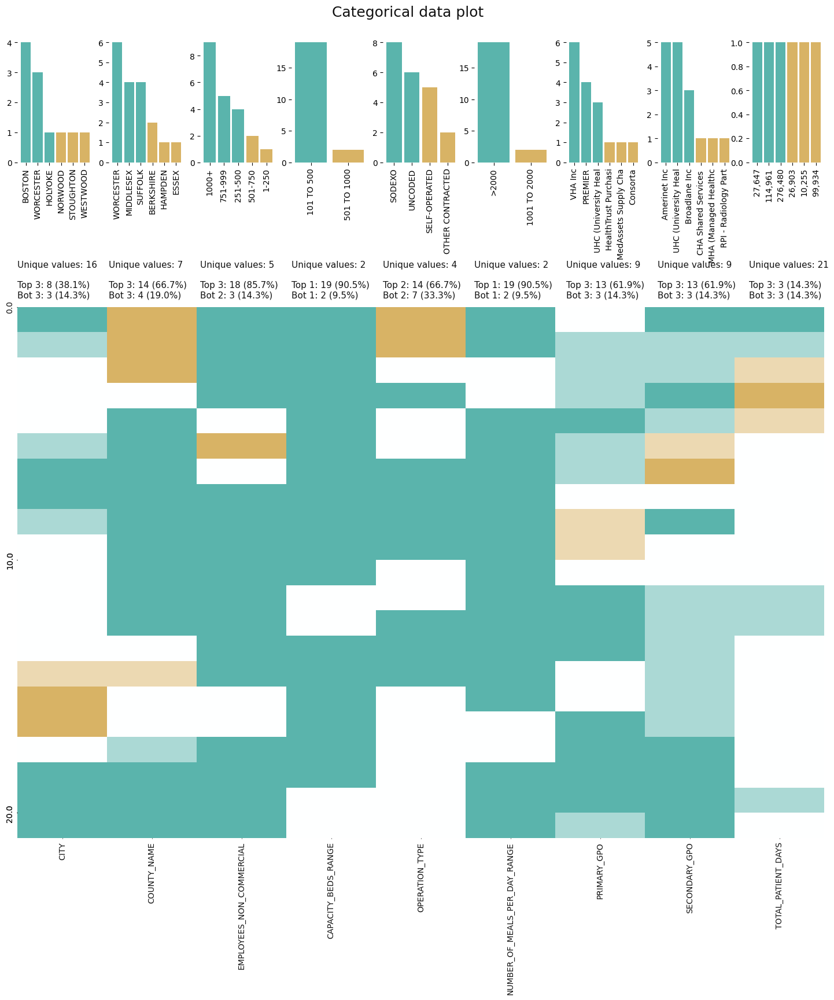

In [32]:
import klib 
klib.cat_plot(kp)

<ipython-input-39-a4d487185f3b>:4: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(kp.corr(),annot=True)


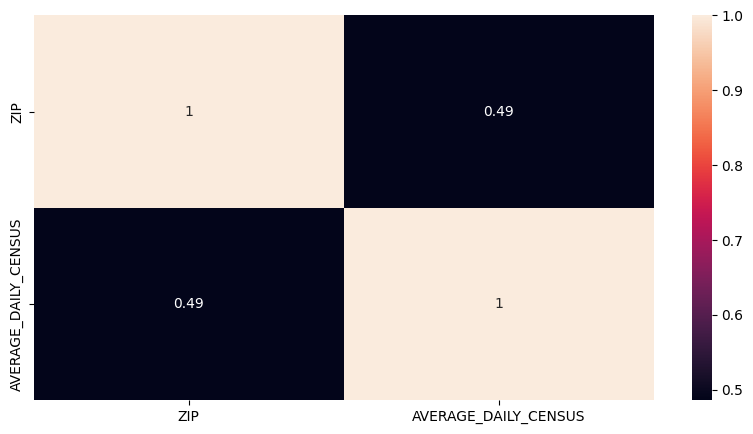

In [39]:
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(10,5))
sns.heatmap(kp.corr(),annot=True)
plt.show()

In [42]:
#histogram 
import plotly.express as px
fig = px.histogram(kp, x="EMPLOYEES_NON_COMMERCIAL", color="OPERATION_TYPE", marginal='box', title='Histogram')
fig.show()

**(i) In the 1-250 range:**

          -> In the only one SODEXO operation type and there are no other operation type

**(ii) In the 251- 500 range:**

        -> There are 3 uncoded operation type and 1 sodexo type
        
**(iii) In the 501- 750 range:**

        -> there is only one self operated operation and only one other contracted operations
        -> there is no room for sodexo and uncoded operation type

**(iv) In the 751-999 range:** 
 
          -> there are 3 uncoded operation
          -> there are 2 self operated operation and no sodexo and other types of contracts 

**(v)In the 1000+'s range**


    ->there are 6 people having SODEXO operation and 
    -> There are 2 people having SELF-OPERATED and 
    -> there are 1 people having other contracts and there are no uncoded operation

In [49]:
kp['NUMBER_OF_MEALS_PER_DAY_RANGE'].unique()

array(['>2000', '1001 TO 2000'], dtype=object)

In [51]:
kp['NUMBER_OF_MEALS_PER_DAY_RANGE']=kp['NUMBER_OF_MEALS_PER_DAY_RANGE'].replace("1001 to 2000","0")
kp['NUMBER_OF_MEALS_PER_DAY_RANGE']=kp['NUMBER_OF_MEALS_PER_DAY_RANGE'].replace(">2000","1")

In [54]:
#3d plot
fig=px.scatter_3d(kp,x='CITY',y='COUNTY_NAME',z='OPERATION_TYPE')
fig.show()

In [55]:
kp.columns

Index(['CITY', 'ZIP', 'COUNTY_NAME', 'EMPLOYEES_NON_COMMERCIAL',
       'CAPACITY_BEDS_RANGE', 'OPERATION_TYPE',
       'NUMBER_OF_MEALS_PER_DAY_RANGE', 'AVERAGE_DAILY_CENSUS', 'PRIMARY_GPO',
       'SECONDARY_GPO', 'TOTAL_PATIENT_DAYS'],
      dtype='object')

In [56]:
#density_contours

fig=px.density_contour(kp,x="EMPLOYEES_NON_COMMERCIAL",y="AVERAGE_DAILY_CENSUS",marginal_x="histogram",marginal_y="box")
fig.show()

This diaagram states that 

**1. Out of the daily census taken, there are several people 
out there in the non commercial sector. These census are 
broken down into 5 stages**

   (i)  1 - 250 -> in this range there is only 1 people in the whole range

   (ii) 251 - 500 -> There are 4 people in this range
   
   (iii) 501 - 750 -> there are 2 people in this range
   
   (iv) 751 - 999 -> there are 5 people in this range
   
   (v) 1000+ -> there are 9 people in this range

In [59]:
#im show
fig = px.imshow(kp.corr())
fig.show()


<ipython-input-59-ae85ec814866>:2: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



<Axes: xlabel='AVERAGE_DAILY_CENSUS', ylabel='TOTAL_PATIENT_DAYS'>

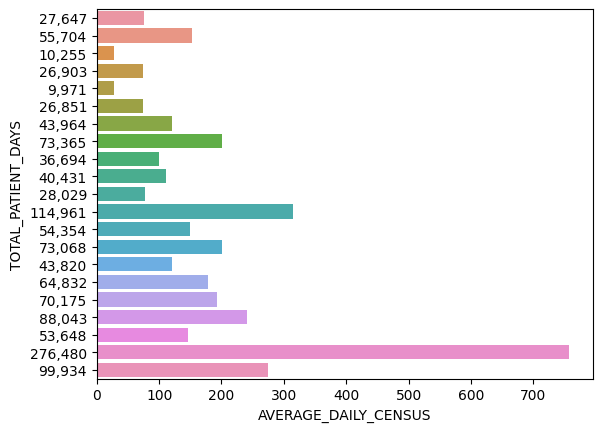

In [63]:
#BarPlot
sns.barplot(data=kp,x='AVERAGE_DAILY_CENSUS',y='TOTAL_PATIENT_DAYS')

In [67]:
#sunburst
fig = px.sunburst(kp, path=['CITY', 'COUNTY_NAME'])
fig.show()

In [69]:
fig = px.sunburst(kp, path=['CITY', 'AVERAGE_DAILY_CENSUS'])
fig.show()

In [70]:
fig = px.sunburst(kp, path=['COUNTY_NAME', 'OPERATION_TYPE'])
fig.show()

**TASK 3: Retail outlets spread across similar geographies.**


In [77]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt 

In [78]:
fd= pd.read_excel('/content/Retail Stores.xlsx')
fd.head()

,NAME,CITY,STATE,ZIP,ZIP_PLUS4,COUNTY_CODE,COUNTY_NAME,MSA,market_segment2,units,EMPLOYEES,years_in_business,annual_sales
0,AZON LIQUORS,AGAWAM,MA,1001,1530.0,25013.0,HAMPDEN,1122.0,LIQUOR STORES,INDEPENDENT (1-9 UNITS),1 TO 4,UNCODED / DATA CURRENTLY UNAVAILABLE,"$500,001 - $1,000,000"
1,CUSTOM WINE ONLINE LLC,COVINGTON,KY,41011,2487.0,21117.0,KENTON,1642.0,LIQUOR STORES,INDEPENDENT (1-9 UNITS),1 TO 4,UNCODED / DATA CURRENTLY UNAVAILABLE,"$2,500,001 - $5,000,000"
2,BP,COVINGTON,KY,41011,1441.0,21117.0,KENTON,1642.0,GAS STATIONS,501+ UNITS,5 TO 9,UNCODED / DATA CURRENTLY UNAVAILABLE,UNCODED
3,DICK'S WINES & LIQUORS,COVINGTON,KY,41011,1528.0,21117.0,KENTON,1642.0,LIQUOR STORES,INDEPENDENT (1-9 UNITS),10 TO 19,UNCODED / DATA CURRENTLY UNAVAILABLE,"<=$500,000"
4,END OF LINE BEVERAGE,FT WRIGHT,KY,41011,2602.0,21117.0,KENTON,1642.0,LIQUOR STORES,INDEPENDENT (1-9 UNITS),1 TO 4,UNCODED / DATA CURRENTLY UNAVAILABLE,UNCODED


In [79]:
fd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1001 entries, 0 to 1000
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   NAME               1001 non-null   object 
 1   CITY               1001 non-null   object 
 2   STATE              1001 non-null   object 
 3   ZIP                1001 non-null   int64  
 4   ZIP_PLUS4          909 non-null    float64
 5   COUNTY_CODE        974 non-null    float64
 6   COUNTY_NAME        974 non-null    object 
 7   MSA                386 non-null    float64
 8   market_segment2    1001 non-null   object 
 9   units              1001 non-null   object 
 10  EMPLOYEES          1001 non-null   object 
 11  years_in_business  1001 non-null   object 
 12  annual_sales       1001 non-null   object 
dtypes: float64(3), int64(1), object(9)
memory usage: 101.8+ KB


In [80]:
fd.columns

Index(['NAME', 'CITY', 'STATE', 'ZIP', 'ZIP_PLUS4', 'COUNTY_CODE',
       'COUNTY_NAME', 'MSA', 'market_segment2', 'units', 'EMPLOYEES',
       'years_in_business', 'annual_sales'],
      dtype='object')

In [84]:
fd.shape

(1001, 13)

In [85]:
fd.isnull().sum()

NAME                   0
CITY                   0
STATE                  0
ZIP                    0
ZIP_PLUS4             92
COUNTY_CODE           27
COUNTY_NAME           27
MSA                  615
market_segment2        0
units                  0
EMPLOYEES              0
years_in_business      0
annual_sales           0
dtype: int64

In [89]:
fd.dropna(inplace=True)
fd

,NAME,CITY,STATE,ZIP,ZIP_PLUS4,COUNTY_CODE,COUNTY_NAME,MSA,market_segment2,units,EMPLOYEES,years_in_business,annual_sales
0,AZON LIQUORS,AGAWAM,MA,1001,1530.0,25013.0,HAMPDEN,1122.0,LIQUOR STORES,INDEPENDENT (1-9 UNITS),1 TO 4,UNCODED / DATA CURRENTLY UNAVAILABLE,"$500,001 - $1,000,000"
1,CUSTOM WINE ONLINE LLC,COVINGTON,KY,41011,2487.0,21117.0,KENTON,1642.0,LIQUOR STORES,INDEPENDENT (1-9 UNITS),1 TO 4,UNCODED / DATA CURRENTLY UNAVAILABLE,"$2,500,001 - $5,000,000"
2,BP,COVINGTON,KY,41011,1441.0,21117.0,KENTON,1642.0,GAS STATIONS,501+ UNITS,5 TO 9,UNCODED / DATA CURRENTLY UNAVAILABLE,UNCODED
3,DICK'S WINES & LIQUORS,COVINGTON,KY,41011,1528.0,21117.0,KENTON,1642.0,LIQUOR STORES,INDEPENDENT (1-9 UNITS),10 TO 19,UNCODED / DATA CURRENTLY UNAVAILABLE,"<=$500,000"
4,END OF LINE BEVERAGE,FT WRIGHT,KY,41011,2602.0,21117.0,KENTON,1642.0,LIQUOR STORES,INDEPENDENT (1-9 UNITS),1 TO 4,UNCODED / DATA CURRENTLY UNAVAILABLE,UNCODED
...,...,...,...,...,...,...,...,...,...,...,...,...,...
987,7-ELEVEN,ENFIELD,CT,6082,3116.0,9003.0,HARTFORD,3280.0,CONVENIENCE STORES,501+ UNITS,5 TO 9,UNCODED / DATA CURRENTLY UNAVAILABLE,"<=$500,000"
989,A & P FOOD STORE,ENFIELD,CT,6082,3061.0,9003.0,HARTFORD,3280.0,GROCERY STORES (LIMITED CHANNEL DISTRIBUTOR),101-250 UNITS,OVER 50,UNCODED / DATA CURRENTLY UNAVAILABLE,"$500,001 - $1,000,000"
995,AMERICAN CONVENIENCE STORE,ENFIELD,CT,6082,3663.0,9003.0,HARTFORD,3280.0,CONVENIENCE STORES,INDEPENDENT (1-9 UNITS),1 TO 4,UNCODED / DATA CURRENTLY UNAVAILABLE,"<=$500,000"
997,COUNTRY CUPBOARD,OWENSBORO,KY,42301,7457.0,21059.0,DAVIESS,5990.0,CONVENIENCE STORES,INDEPENDENT (1-9 UNITS),1 TO 4,UNCODED / DATA CURRENTLY UNAVAILABLE,"<=$500,000"


In [88]:
fd.describe()

,ZIP,ZIP_PLUS4,COUNTY_CODE,MSA
count,374.000000,374.000000,374.000000,374.000000
mean,31438.144385,3789.534759,18168.925134,2159.438503
std,15954.688479,2915.179272,5317.141714,826.532766
min,1001.000000,1002.000000,9003.000000,1122.000000
25%,6078.000000,1528.000000,21015.000000,1642.000000
50%,41040.000000,2419.000000,21037.000000,1642.000000
75%,41075.000000,5001.750000,21117.000000,3280.000000
max,42301.000000,9776.000000,25027.000000,5990.000000


In [90]:
fd.isnull().values.any()

False

In [92]:
ak=fd.fillna(0)
ak=fd.fillna(fd.median())
ak.head()

<ipython-input-92-195d72b04fe8>:2: FutureWarning:

The default value of numeric_only in DataFrame.median is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.



,NAME,CITY,STATE,ZIP,ZIP_PLUS4,COUNTY_CODE,COUNTY_NAME,MSA,market_segment2,units,EMPLOYEES,years_in_business,annual_sales
0,AZON LIQUORS,AGAWAM,MA,1001,1530.0,25013.0,HAMPDEN,1122.0,LIQUOR STORES,INDEPENDENT (1-9 UNITS),1 TO 4,UNCODED / DATA CURRENTLY UNAVAILABLE,"$500,001 - $1,000,000"
1,CUSTOM WINE ONLINE LLC,COVINGTON,KY,41011,2487.0,21117.0,KENTON,1642.0,LIQUOR STORES,INDEPENDENT (1-9 UNITS),1 TO 4,UNCODED / DATA CURRENTLY UNAVAILABLE,"$2,500,001 - $5,000,000"
2,BP,COVINGTON,KY,41011,1441.0,21117.0,KENTON,1642.0,GAS STATIONS,501+ UNITS,5 TO 9,UNCODED / DATA CURRENTLY UNAVAILABLE,UNCODED
3,DICK'S WINES & LIQUORS,COVINGTON,KY,41011,1528.0,21117.0,KENTON,1642.0,LIQUOR STORES,INDEPENDENT (1-9 UNITS),10 TO 19,UNCODED / DATA CURRENTLY UNAVAILABLE,"<=$500,000"
4,END OF LINE BEVERAGE,FT WRIGHT,KY,41011,2602.0,21117.0,KENTON,1642.0,LIQUOR STORES,INDEPENDENT (1-9 UNITS),1 TO 4,UNCODED / DATA CURRENTLY UNAVAILABLE,UNCODED


In [95]:
fd.columns.value_counts().sum()

13

In [100]:
fd.columns

Index(['NAME', 'CITY', 'STATE', 'ZIP', 'ZIP_PLUS4', 'COUNTY_CODE',
       'COUNTY_NAME', 'MSA', 'market_segment2', 'units', 'EMPLOYEES',
       'years_in_business', 'annual_sales'],
      dtype='object')

In [104]:
#fd.drop(['NAME, ZIP_PLUS4, COUNTRY_CODE, MSA'],axis=1,inplace=True)

fd.drop(['NAME','ZIP_PLUS4','COUNTY_CODE','MSA'],axis=1,inplace=True)

In [105]:
for x in fd.columns:
  print(x,':',len(fd[x].unique()))

CITY : 59
STATE : 3
ZIP : 51
COUNTY_NAME : 15
market_segment2 : 9
units : 5
EMPLOYEES : 5
years_in_business : 3
annual_sales : 6


GridSpec(6, 8)

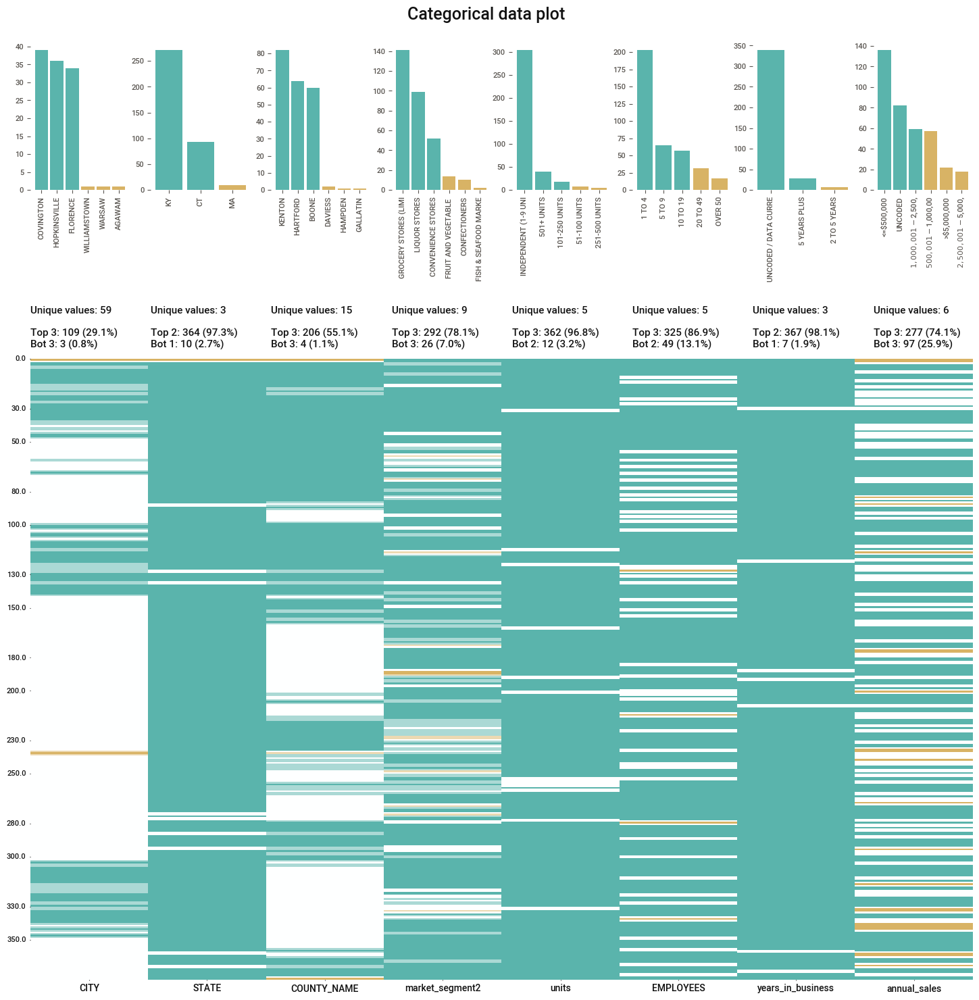

In [106]:
import klib 
klib.cat_plot(fd)

In [109]:
fd[['market_segment2','CITY']]


,market_segment2,CITY
0,LIQUOR STORES,AGAWAM
1,LIQUOR STORES,COVINGTON
2,GAS STATIONS,COVINGTON
3,LIQUOR STORES,COVINGTON
4,LIQUOR STORES,FT WRIGHT
...,...,...
987,CONVENIENCE STORES,ENFIELD
989,GROCERY STORES (LIMITED CHANNEL DISTRIBUTOR),ENFIELD
995,CONVENIENCE STORES,ENFIELD
997,CONVENIENCE STORES,OWENSBORO


In [123]:
#histogram 
import plotly.express as px
fig = px.histogram(fd, x="market_segment2", color="CITY", marginal='box', title='Histogram')
fig.show()

In [127]:
fd.columns

Index(['CITY', 'STATE', 'ZIP', 'COUNTY_NAME', 'market_segment2', 'units',
       'EMPLOYEES', 'years_in_business', 'annual_sales'],
      dtype='object')

In [129]:
fd['market_segment2'].unique()

array(['LIQUOR STORES', 'GAS STATIONS',
       'GROCERY STORES (LIMITED CHANNEL DISTRIBUTOR)', 'MEAT MARKET',
       'CONVENIENCE STORES', 'FRUIT AND VEGETABLE MARKETS',
       'CONFECTIONERS', 'OTHER FOOD SPECIALIST RETAILERS',
       'FISH & SEAFOOD MARKET'], dtype=object)

In [137]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()


In [138]:
fd['CITY']= le.fit_transform(fd['CITY'])
fd['STATE']= le.fit_transform(fd['STATE'])
fd['ZIP']= le.fit_transform(fd['ZIP'])
fd['COUNTY_NAME']= le.fit_transform(fd['COUNTY_NAME'])
fd['market_segment2']= le.fit_transform(fd['market_segment2'])
fd['units']= le.fit_transform(fd['units'])
fd['EMPLOYEES']= le.fit_transform(fd['EMPLOYEES'])
fd['years_in_business']= le.fit_transform(fd['years_in_business'])
fd['annual_sales']= le.fit_transform(fd['annual_sales'])

In [139]:
fd

,CITY,STATE,ZIP,COUNTY_NAME,market_segment2,units,EMPLOYEES,years_in_business,annual_sales
0,0,2,0,8,6,4,0,2,2
1,5,1,17,10,6,4,0,2,1
2,5,1,17,10,4,2,3,2,5
3,5,1,17,10,6,4,1,2,3
4,21,1,17,10,6,4,0,2,5
...,...,...,...,...,...,...,...,...,...
987,15,0,16,9,1,2,3,2,3
989,15,0,16,9,5,0,4,2,2
995,15,0,16,9,1,4,0,2,3
997,35,1,50,4,1,4,0,2,3


<Axes: ylabel='count'>

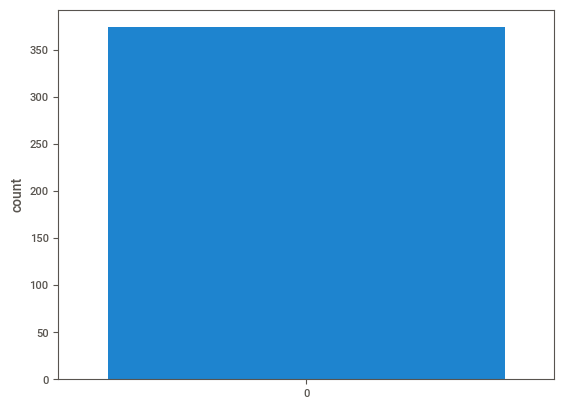

In [141]:
sns.countplot(fd["market_segment2"])


In [146]:
fd['annual_sales'].unique()

array([2, 1, 5, 3, 0, 4])

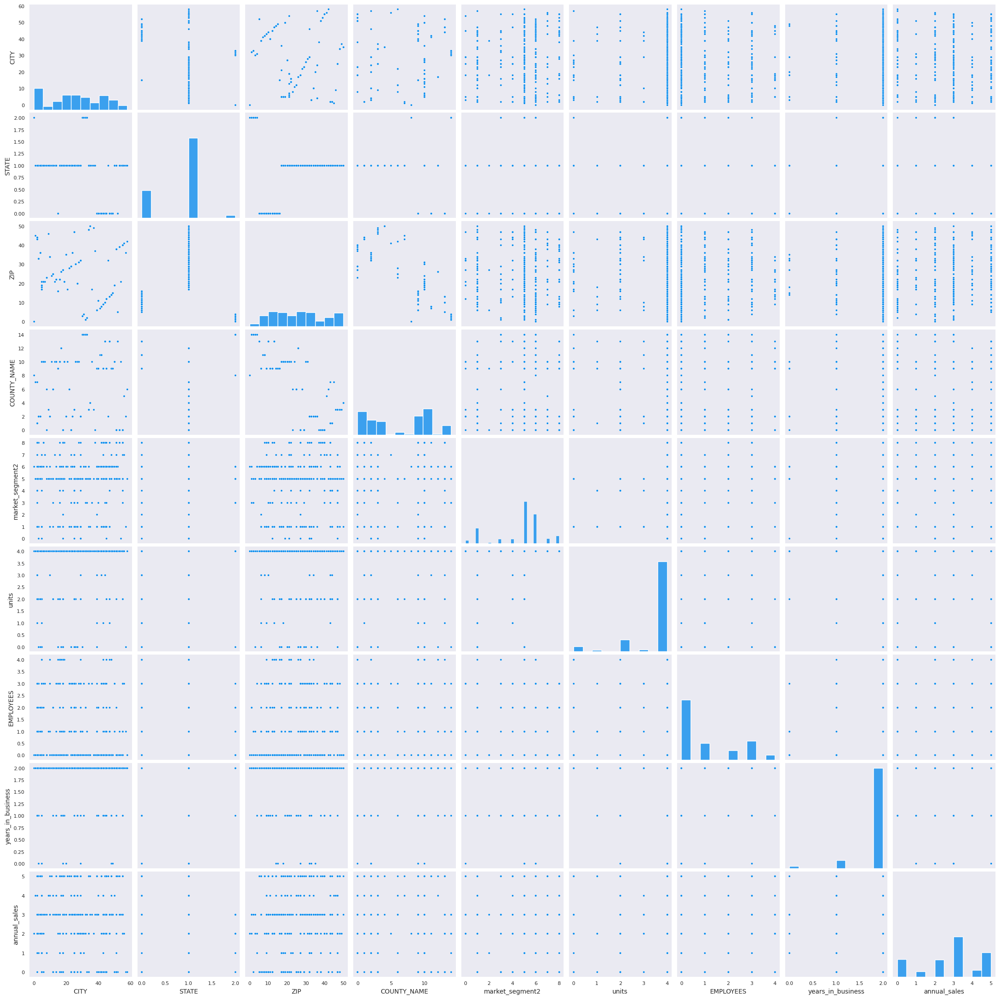

In [147]:
#pairplot
sns.set_style("dark")
sns.pairplot(fd)

<Axes: >

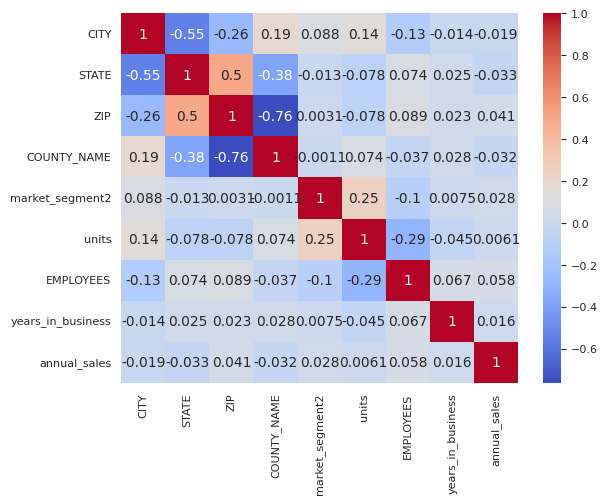

In [148]:
##correlation
corr = fd.corr()
sns.heatmap(corr, annot=True, cmap='coolwarm')

<Axes: xlabel='CITY', ylabel='annual_sales'>

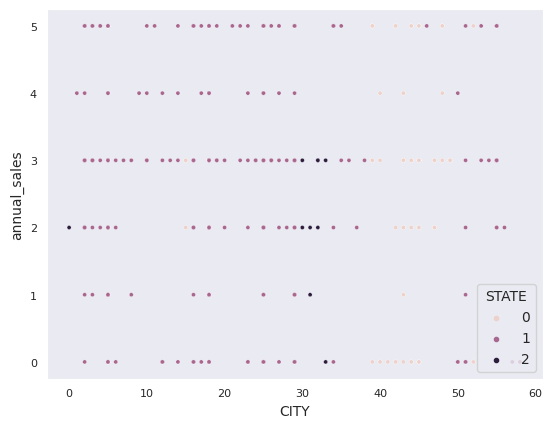

In [149]:
#scatterplot
sns.scatterplot(data=fd,x='CITY',y='annual_sales',hue='STATE')

<Axes: xlabel='annual_sales', ylabel='EMPLOYEES'>

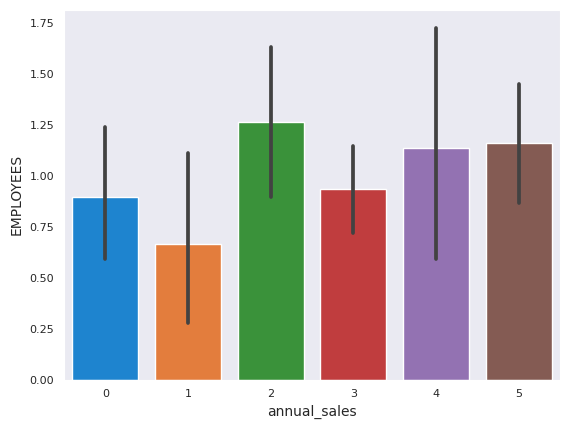

In [150]:
#BarPlot
sns.barplot(data=fd,x='annual_sales',y='EMPLOYEES')

<Axes: xlabel='market_segment2', ylabel='count'>

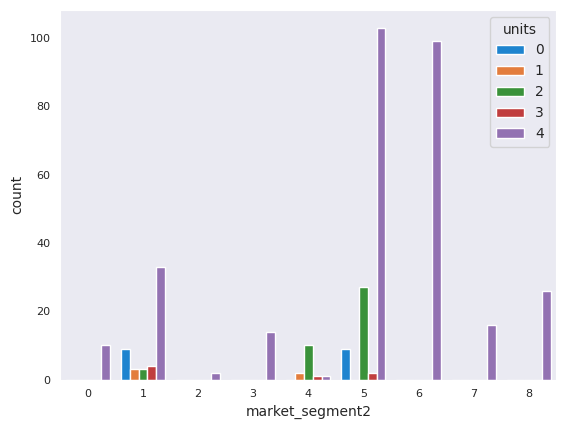

In [151]:
#countplot 
sns.countplot(data=fd,x='market_segment2',hue='units')

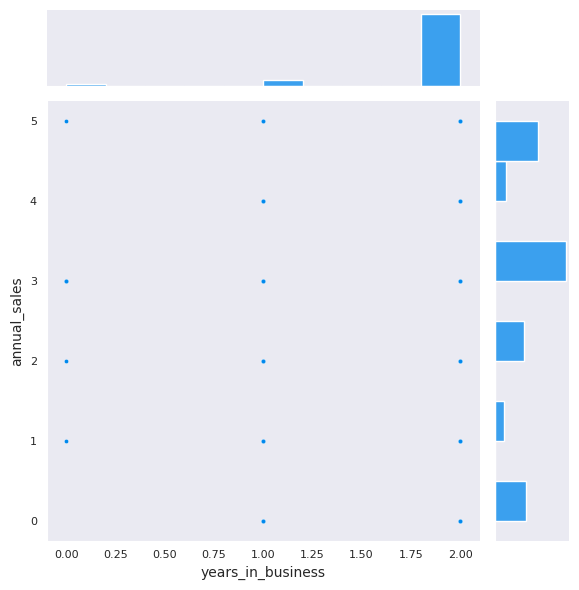

In [154]:
#Jointplot
sns.jointplot(x='years_in_business',y='annual_sales',data=fd)

In [158]:
klib.corr_mat(fd) # returns a color-encoded correlation matrix

,CITY,STATE,ZIP,COUNTY_NAME,market_segment2,units,EMPLOYEES,years_in_business,annual_sales
CITY,1.00,-0.55,-0.26,0.19,0.09,0.14,-0.13,-0.01,-0.02
STATE,-0.55,1.00,0.50,-0.38,-0.01,-0.08,0.07,0.03,-0.03
ZIP,-0.26,0.50,1.00,-0.76,0.00,-0.08,0.09,0.02,0.04
COUNTY_NAME,0.19,-0.38,-0.76,1.00,-0.00,0.07,-0.04,0.03,-0.03
market_segment2,0.09,-0.01,0.00,-0.00,1.00,0.25,-0.10,0.01,0.03
units,0.14,-0.08,-0.08,0.07,0.25,1.00,-0.29,-0.04,0.01
EMPLOYEES,-0.13,0.07,0.09,-0.04,-0.10,-0.29,1.00,0.07,0.06
years_in_business,-0.01,0.03,0.02,0.03,0.01,-0.04,0.07,1.00,0.02
annual_sales,-0.02,-0.03,0.04,-0.03,0.03,0.01,0.06,0.02,1.00


In [160]:
klib.missingval_plot(fd) # returns a figure containing information about missing values

No missing values found in the dataset.


In [166]:
klib.clean_column_names(fd) # cleans and standardizes column names, also called inside data_cleaning()


,city,state,zip,county_name,market_segment2,units,employees,years_in_business,annual_sales
0,0,2,0,8,6,4,0,2,2
1,5,1,17,10,6,4,0,2,1
2,5,1,17,10,4,2,3,2,5
3,5,1,17,10,6,4,1,2,3
4,21,1,17,10,6,4,0,2,5
...,...,...,...,...,...,...,...,...,...
987,15,0,16,9,1,2,3,2,3
989,15,0,16,9,5,0,4,2,2
995,15,0,16,9,1,4,0,2,3
997,35,1,50,4,1,4,0,2,3


In [167]:
fd.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 374 entries, 0 to 999
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype
---  ------             --------------  -----
 0   city               374 non-null    int64
 1   state              374 non-null    int64
 2   zip                374 non-null    int64
 3   county_name        374 non-null    int64
 4   market_segment2    374 non-null    int64
 5   units              374 non-null    int64
 6   employees          374 non-null    int64
 7   years_in_business  374 non-null    int64
 8   annual_sales       374 non-null    int64
dtypes: int64(9)
memory usage: 37.3 KB


In [168]:
klib.mv_col_handling(fd)


,city,state,zip,county_name,market_segment2,units,employees,years_in_business,annual_sales
0,0,2,0,8,6,4,0,2,2
1,5,1,17,10,6,4,0,2,1
2,5,1,17,10,4,2,3,2,5
3,5,1,17,10,6,4,1,2,3
4,21,1,17,10,6,4,0,2,5
...,...,...,...,...,...,...,...,...,...
987,15,0,16,9,1,2,3,2,3
989,15,0,16,9,5,0,4,2,2
995,15,0,16,9,1,4,0,2,3
997,35,1,50,4,1,4,0,2,3
